# GEOG5302 Assessment 2: Data Science Mini Project Guidance



## **Introduction, Background, and Research Questions**  

Housing prices in cities are both influenced by and influential on economic, spatial, and social factors. This explains how significant number of research studies have focused on understanding the complexities of the housing market in cities and its impacts on the surrounding environment. And a wide range of theories and models have been developed applying either qualitative or quantitative research methodologies across different economic and geographical contexts to explore the subject. Given the broad scope of the concept, as well as the goals and limitations of this submission, not even a close to a structured literature review was possible. Instead, a selective review is provided to briefly mention some classical and recent studies that explore the housing market from different perspectives in cities. Some studies are focused on:

- Exploring the factors which shapes the housing demands in cities: 'the housing-space requirenemnts' and demographical changes (Clark and Huang, 2003), the income groups and the locational preferences to reside (Duijn and Rouwendal, 2021)

- Studying the operation of factors such as planning (Evans, 1973; White and Allmendinger, 2003; Evans, 2008) on the housing market

- Develping models to either address the characteristics and shape of the housing market demand (Berry et al., 1995;  Meen and Meen, 2003)

This study explores the relationship between employment distribution across industries, and not the residents either employement or income status, and housing prices in Greater London, aiming to understand how workforce composition and spatial clustering correlates with property values. And the main aim of the study is to **understand how the number of jobs provided in differents parts of a metroploitan area may changes the housing market in the surrounding neighbourhooe.** 

Considering the concept of the current study, narrowing the literature reveiw on the models develped to exploring ecnoomic attributes of the housing price sounds more practical. One of the most relevant studies on the mentioned subject is Gaspareniene and Remeikiene (2014) critical review. Despite the geographical differences, the study provided a valuable insight on the factors contributing in housing -economic models by reviewing advantages and disadvantages and the structural elements of their selected models: 'demand factor group' and 'housing for the end-users' (Sing, 2001), 'Social and physical elements of neighbourhood environment' (Portnov et al., 2005), 'Micro and macro environment factors' (Zavadskas et al., 2005) and 'labour market income and housing costs' (Chen et al., 2012) are some of the most appropriate factors to the subject of the current study which they were extracted and reported in the mentioned critical review.

Overall, providing a reliable literature foundation for this mini-projects aim requires spendig more structured and extensive efforts. However, considering any changes in the jobs available in urban areas and their secondary effects on commuting patterns, neighborhood services, land prices, housing affordability, as well as regulatory factors such as zoning or taxation policies, some level of change in both housing supply and demand is inevitable. Yet, the exact nature and extent of these changes are not clear. The ambiguity and uncertainity of the changes in the urban context makes understanding and predicting the housing prices more challenging. Theerefore, the key research questions of this mini-project are designed to explore that:


### **Research Questions**  
1. **How do housing prices in Greater London correlate with local employee counts?**  
   To address this question, I will investigate whether areas with different employee numbers exhibit variations in housing prices. The following hypotheses are developed to examine this relationship:  
   - H₀ (Null Hypothesis): Housing prices do not differ significantly between areas with high and low employee numbers.
   - H₁ (Alternative Hypothesis): Housing prices differ significantly between areas with high and low employee numbers.

2. **How do different industries impact housing prices in Greater London?**  
   To assess the relationship between industry composition and housing prices in Greater London, correlations between the number of employees in different industries and housing prices will be examined to test the following hypotheses for each industry category:  
   - H₀ (Null Hypothesis): There is no statistically significant correlation between the number of employees in different industries and housing prices.  
   - H₁ (Alternative Hypothesis): There is a statistically significant correlation between the number of employees in different industries and housing prices..  

3. **Can a predictive model estimate housing prices in Greater London based on local employment numbers?**  
   To answer this question, a model will be developed to predict housing prices using variations in local employee counts within the Greater London Authority. The model's accuracy and validity will then be assessed to determine its predictive performance.  

### **Workflow** 
To answer the questions above, this mini-project will follow a structured approach to analyse the relationship between employment distribution and housing prices in Greater London, integrating statistical and spatial analyses. The workflow is divided into key stages:

- **Data Preparation & Cleaning** 
- **Visual and Statistical Analysis**
- **Spatial Visualisation and Analysis**
- **Findings and Discussion**


### **Data**

This study utilises a few datasets obtained from official websites and services, ensuring data accuracy and reliability. The table below summarises the datasets, their sources, and their relevance to the research questions.

| Dataset | Source | Description | Relevance to Study | Link |
|---------|--------|-------------|--------------------|------|
| Median House Prices by MSOA | Office for National Statistics (ONS) | Provides median housing prices at the Middle Layer Super Output Area (MSOA) level across England and Wales. | Used to analyse variations in housing prices across Greater London. | [ONS Dataset](https://www.ons.gov.uk/peoplepopulationandcommunity/housing/datasets/medianhousepricesbymiddlelayersuperoutputarea) |
| Business Register and Employment Survey (BRES) | NOMIS | Contains detailed employment data by industry at the MSOA level, derived from business surveys and administrative records. | Helps assess the impact of different industry sectors on local housing prices. | [NOMIS Dataset](https://www.nomisweb.co.uk/query/construct/summary.asp?mode=construct&version=0&dataset=189) |
| Geospatial Boundaries of MSOAs | ONS Geoportal | Provides the spatial boundaries of MSOAs as shapefiles, enabling geographic analysis. | Used to spatially join housing prices and employment data for spatial regression and clustering analysis. | [ONS Geoportal](https://geoportal.statistics.gov.uk/datasets/61ff711e89ba4c24ae5dc8a487e422a8_0/explore?location=52.742527%2C-2.465415%2C6.87) |

In [1]:
!pip install palettable==3.3.0
!pip install descartes==1.1.0
!pip install pysal==2.6.0
!pip install contextily
!pip install geopandas
!pip install folium matplotlib mapclassify palettable descartes pysal contextily matplotlib_scalebar geopandas
!pip install openpyxl


import pandas as pd
import geopandas as gpd
pd.options.mode.chained_assignment = None
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import contextily as cx
from sklearn import metrics
from scipy.stats import shapiro

from scipy.stats import mannwhitneyu
from matplotlib_scalebar.scalebar import ScaleBar

pd.options.mode.chained_assignment = None

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Defaulting to user insta

/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Data Wrangling
Before analysing the data, it is necessary to prepare the dataframes by filtering observations based on relevant variables and time periods, handling missing values and outliers, and merging datasets.

In [2]:
#Use Pandas to read an excel file
housing_data = pd.read_excel('medianhousepricesbymiddlelayersuperoutputarea.xlsx', sheet_name='1a', header=2) # Focus on the specific Sheet and define row 3 (index 2) as data header

In [3]:
#Check the first 5 lines (heading) of the data frame
housing_data.head()

,Local authority code,Local authority name,MSOA code,MSOA name,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,...,Year ending Dec 2021,Year ending Mar 2022,Year ending Jun 2022,Year ending Sep 2022,Year ending Dec 2022,Year ending Mar 2023,Year ending Jun 2023,Year ending Sep 2023,Year ending Dec 2023,Year ending Mar 2024
0,E06000001,Hartlepool,E02002483,Hartlepool 001,50375,49725,49725,49950,56000,56500,...,159975.0,157150.0,160000.0,160000.0,165000.0,179950.0,166500.0,176000.0,163750.0,156500.0
1,E06000001,Hartlepool,E02002484,Hartlepool 002,31500,30000,30000,28500,28500,28000,...,114000.0,110000.0,110000.0,110000.0,116500.0,125000.0,130500.0,127500.0,120000.0,115000.0
2,E06000001,Hartlepool,E02002485,Hartlepool 003,25000,26250,28000,30000,32500,33500,...,84500.0,90000.0,93000.0,94000.0,95880.0,97000.0,105000.0,107500.0,102500.0,97500.0
3,E06000001,Hartlepool,E02002489,Hartlepool 007,30000,30500,32500,32000,30000,29950,...,86500.0,82750.0,72500.0,69999.0,72750.0,74974.5,78500.0,86000.0,82000.0,84499.5
4,E06000001,Hartlepool,E02002490,Hartlepool 008,27000,28000,28500,28500,30000,28250,...,65999.0,66500.0,67000.0,74999.0,77375.0,82000.0,83500.0,79499.0,78499.5,78000.0


In [4]:
# Creat a subset with local authorities in Greater London
Greater_London_data = housing_data[housing_data['Local authority code'].str.startswith('E09')]


In [5]:
#Check the number of rows and columns in the data frame
Greater_London_data.shape

(1002, 118)

In [6]:
# Function to find the rows which have null value and show the number of nulls
def null_index_summary(df):
    null_summary = []  # Empty list to add results
    for index in df.index:
        null_count = df.loc[index].isnull().sum()  # Count nulls in each row
        if null_count > 0:  # If row has nulls
            null_summary.append((index, null_count))  # Append (index, count)
    return null_summary

In [7]:
# Check for null values in the data frame
null_index_summary(Greater_London_data)

[]

In [8]:
#Use Pandas to read data frame
BRES = pd.read_csv('Industry2023.csv', skiprows=7, low_memory=False) #Skip the first rows contatining dataset description,  add low memory false to avoid error in reading the large file

In [9]:
#Check on data frame shape
BRES.shape

(28849, 38)

In [10]:
#Check the first 5 lines (data fareme head)
BRES.head()

,Area,mnemonic,"1 : Agriculture, forestry & fishing (A)",Unnamed: 3,"2 : Mining, quarrying & utilities (B,D and E)",Unnamed: 5,3 : Manufacturing (C),Unnamed: 7,4 : Construction (F),Unnamed: 9,...,14 : Business administration & support services (N),Unnamed: 29,15 : Public administration & defence (O),Unnamed: 31,16 : Education (P),Unnamed: 33,17 : Health (Q),Unnamed: 35,"18 : Arts, entertainment, recreation & other services (R,S,T and U)",Unnamed: 37
0,gor:London,E12000007,1500,NaN,34000,NaN,119000,NaN,200000,NaN,...,599000,NaN,256000,NaN,390000,NaN,612000,NaN,291000,NaN
1,msoa2011:Darlington 001,E02002559,5,*,20,NaN,800,NaN,250,NaN,...,1000,NaN,400,NaN,350,NaN,1000,NaN,225,NaN
2,msoa2011:Darlington 002,E02002560,10,*,0,NaN,75,NaN,75,NaN,...,35,NaN,0,NaN,100,NaN,75,NaN,30,NaN
3,msoa2011:Darlington 003,E02002561,0,*,0,NaN,15,NaN,45,NaN,...,0,NaN,0,NaN,100,NaN,150,NaN,20,NaN
4,msoa2011:Darlington 004,E02002562,0,*,0,NaN,125,NaN,40,NaN,...,40,NaN,0,NaN,150,NaN,175,NaN,75,NaN


In [11]:
#Replace '*' with NaN
BRES = BRES.replace('*', np.nan)  

/var/folders/wd/1wf586s93vg1fbnl295w_w1r0000gn/T/ipykernel_74498/1597629971.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  BRES = BRES.replace('*', np.nan)


In the second step of cleaning the data set, rows and columns which they are empty (all values are null) are dropped:

In [12]:
#Drop rows which all values are null
BRES = BRES.dropna(axis=0, how='all')  #Set the details to function work over rows with all values being null

#Drop columns which all values are null
BRES = BRES.dropna(axis=1, how='all')  #Set the details to function work over comuns with all values being null

In the process of cleaning data, the 'Area' column is focused below:

Since the only expected values for this column is MSOA codes, after deletin null values, the data frame will be limited to the rows which there 'Area' value starts with 'msoa'.

In [13]:
BRES = BRES.dropna(subset=['Area'])

In [14]:
# Filter rows where 'Area' starts with 'msoa'
BRES = BRES[BRES['Area'].str.startswith('msoa')]

In [15]:
#Check the number of the remaind missing values in the data frame
(BRES.isnull()).sum()

Area                                                                   0
mnemonic                                                               0
1 : Agriculture, forestry & fishing (A)                                0
2 : Mining, quarrying & utilities (B,D and E)                          0
3 : Manufacturing (C)                                                  0
4 : Construction (F)                                                   0
5 : Motor trades (Part G)                                              0
6 : Wholesale (Part G)                                                 0
7 : Retail (Part G)                                                    0
8 : Transport & storage (inc postal) (H)                               0
9 : Accommodation & food services (I)                                  0
10 : Information & communication (J)                                   0
11 : Financial & insurance (K)                                         0
12 : Property (L)                                  

In [16]:
# Find duplicates in 'mnemonic' column and sort them
duplicates = BRES[BRES.duplicated(subset='mnemonic', keep=False)]
duplicates = duplicates.sort_values(by='mnemonic')  # Sort by mnemonic for clarity
duplicates

,Area,mnemonic,"1 : Agriculture, forestry & fishing (A)","2 : Mining, quarrying & utilities (B,D and E)",3 : Manufacturing (C),4 : Construction (F),5 : Motor trades (Part G),6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)"
25671,msoa2011:City of London 001,E02000001,30,3000,3500,9000,100,7000,6000,6000,20000,101000,220000,11000,170000,83000,1750,7000,15000,14000
4029,msoa2011:City of London 001,E02000001,30,3000,3500,9000,100,7000,6000,6000,20000,101000,218000,11000,157000,83000,1750,7000,15000,13000
11243,msoa2011:City of London 001,E02000001,25,3000,3000,7000,50,6000,3500,5000,11000,96000,206000,8000,141000,64000,1500,4500,11000,10000
18457,msoa2011:City of London 001,E02000001,5,200,600,1500,40,1000,2500,600,8000,5000,11000,2500,16000,19000,200,2250,4000,3500
11611,msoa2011:Barking and Dagenham 001,E02000002,0,0,20,100,15,30,40,30,100,30,0,10,25,40,0,10,100,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14299,msoa2011:Cardiff 048,W02000422,0,175,1250,800,150,300,500,450,700,1500,600,100,1000,800,3000,300,400,700
7086,msoa2011:Cardiff 049,W02000423,0,1000,100,700,225,350,300,20,250,1000,2500,1000,4000,1250,1750,1000,900,500
14300,msoa2011:Cardiff 049,W02000423,0,800,75,700,225,300,125,20,125,900,2250,1000,3500,1000,1500,600,600,400
28728,msoa2011:Cardiff 049,W02000423,0,1000,100,700,225,350,300,20,300,1000,2500,1000,4000,1250,1750,1000,900,500


During data exploration, multiple entries founded for the same MSOA codes with differing employees values across industries. After verifying that  area is matched within these MSOAs, I concluded that these entries likely represent distinct observations that for some reason, were not aggregated in the original dataset .No clear explanation found in dataset documentation (Nomis, 2024) either. Given the scope and time limitations of this project, aggregating employee counts within each industry is chosen for now, to proceed with the analysis.
Future work may involve contacting data providers for clarification or revising this approach based on additional information.
But before aggregating data, the data type needs to be changed in columns showing employee numbers from object to a numeric format:

In [17]:
# Change the data type of columns reflecting employee numbers to integer
BRES[BRES.columns[2:]] = BRES[BRES.columns[2:]].astype('Int64')

BRES.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28804 entries, 1 to 28843
Data columns (total 20 columns):
 #   Column                                                               Non-Null Count  Dtype 
---  ------                                                               --------------  ----- 
 0   Area                                                                 28804 non-null  object
 1   mnemonic                                                             28804 non-null  object
 2   1 : Agriculture, forestry & fishing (A)                              28804 non-null  Int64 
 3   2 : Mining, quarrying & utilities (B,D and E)                        28804 non-null  Int64 
 4   3 : Manufacturing (C)                                                28804 non-null  Int64 
 5   4 : Construction (F)                                                 28804 non-null  Int64 
 6   5 : Motor trades (Part G)                                            28804 non-null  Int64 
 7   6 : Wholesale (Par

In [18]:
# Aggregate values by summing them for duplicates
BRES = BRES.groupby(['mnemonic', 'Area'], as_index=False).sum()  # Set the aggregation on rows

# Check the updated DataFrame
BRES

,mnemonic,Area,"1 : Agriculture, forestry & fishing (A)","2 : Mining, quarrying & utilities (B,D and E)",3 : Manufacturing (C),4 : Construction (F),5 : Motor trades (Part G),6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)"
0,E02000001,msoa2011:City of London 001,90,9200,10600,26500,290,21000,18000,17600,59000,303000,655000,32500,484000,249000,5200,20750,45000,40500
1,E02000002,msoa2011:Barking and Dagenham 001,0,10,60,440,65,120,290,135,750,105,0,45,90,220,0,55,450,120
2,E02000003,msoa2011:Barking and Dagenham 002,0,60,465,675,380,1050,1325,230,1175,285,70,150,455,675,0,925,1325,1725
3,E02000004,msoa2011:Barking and Dagenham 003,0,50,0,305,15,0,190,60,190,30,0,290,75,450,0,1800,225,50
4,E02000005,msoa2011:Barking and Dagenham 004,0,0,45,525,85,150,450,105,365,120,20,35,155,90,0,1500,160,125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7196,W02000419,msoa2011:Denbighshire 017,0,0,45,315,30,10,225,35,215,15,15,0,180,155,20,1250,600,155
7197,W02000420,msoa2011:Wrexham 020,145,1210,26600,2125,820,2425,2050,2425,1775,1020,155,310,1775,3050,4350,1800,2150,1325
7198,W02000421,msoa2011:Ceredigion 011,75,150,550,1775,415,455,625,525,475,70,40,95,325,490,160,1200,1225,340
7199,W02000422,msoa2011:Cardiff 048,0,530,3825,2450,510,1040,3700,1495,4600,4625,2050,390,3725,3025,10700,2100,1775,3000


In [19]:
# Recheck for duplicates in 'mnemonic' column and sort them
duplicates = BRES[BRES.duplicated(subset='mnemonic', keep=False)]
duplicates = duplicates.sort_values(by='mnemonic')  # Sort by mnemonic for clarity
duplicates

,mnemonic,Area,"1 : Agriculture, forestry & fishing (A)","2 : Mining, quarrying & utilities (B,D and E)",3 : Manufacturing (C),4 : Construction (F),5 : Motor trades (Part G),6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)"


In [20]:
# Drop Area column
BRES= BRES.drop(columns=['Area'])

In [21]:
BRES.head()

,mnemonic,"1 : Agriculture, forestry & fishing (A)","2 : Mining, quarrying & utilities (B,D and E)",3 : Manufacturing (C),4 : Construction (F),5 : Motor trades (Part G),6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)"
0,E02000001,90,9200,10600,26500,290,21000,18000,17600,59000,303000,655000,32500,484000,249000,5200,20750,45000,40500
1,E02000002,0,10,60,440,65,120,290,135,750,105,0,45,90,220,0,55,450,120
2,E02000003,0,60,465,675,380,1050,1325,230,1175,285,70,150,455,675,0,925,1325,1725
3,E02000004,0,50,0,305,15,0,190,60,190,30,0,290,75,450,0,1800,225,50
4,E02000005,0,0,45,525,85,150,450,105,365,120,20,35,155,90,0,1500,160,125


In [22]:
BRES.shape

(7201, 19)

Changing the data shape from wide to long simplifies analysis by introducing a new column, 'Industry', as a categorical variable. This restructuring facilitates the visualisation of employee distributions across industries within each area.

In [23]:
# Reshape BRES from wide to long format
BRES2 = BRES.melt(id_vars='mnemonic', var_name='Industry', value_name='Employees')

In [24]:
BRES2.head()

,mnemonic,Industry,Employees
0,E02000001,"1 : Agriculture, forestry & fishing (A)",90
1,E02000002,"1 : Agriculture, forestry & fishing (A)",0
2,E02000003,"1 : Agriculture, forestry & fishing (A)",0
3,E02000004,"1 : Agriculture, forestry & fishing (A)",0
4,E02000005,"1 : Agriculture, forestry & fishing (A)",0


In [25]:
# Find any potential duplicates (same 'mnemonic' and 'Industry')
duplicates = BRES2[BRES2.duplicated(subset=['mnemonic', 'Industry'], keep=False)]
duplicates


,mnemonic,Industry,Employees


In [26]:
BRES2.shape

(129618, 3)

In [27]:
BRES2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129618 entries, 0 to 129617
Data columns (total 3 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   mnemonic   129618 non-null  object
 1   Industry   129618 non-null  object
 2   Employees  129618 non-null  Int64 
dtypes: Int64(1), object(2)
memory usage: 3.1+ MB


In [28]:
# Recheck the headings of the two data frame to find the matching column to join
BRES2.head()

,mnemonic,Industry,Employees
0,E02000001,"1 : Agriculture, forestry & fishing (A)",90
1,E02000002,"1 : Agriculture, forestry & fishing (A)",0
2,E02000003,"1 : Agriculture, forestry & fishing (A)",0
3,E02000004,"1 : Agriculture, forestry & fishing (A)",0
4,E02000005,"1 : Agriculture, forestry & fishing (A)",0


In [29]:
# Recheck the headings of the two data frame to find the matching column to join
Greater_London_data.head()

,Local authority code,Local authority name,MSOA code,MSOA name,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,...,Year ending Dec 2021,Year ending Mar 2022,Year ending Jun 2022,Year ending Sep 2022,Year ending Dec 2022,Year ending Mar 2023,Year ending Jun 2023,Year ending Sep 2023,Year ending Dec 2023,Year ending Mar 2024
5854,E09000001,City of London,E02000001,City of London 001,105000,112500,112375,121500,124250,127000,...,810000.0,827500.0,860000.0,850000.0,825000.0,825000.0,885000.0,925000.0,890000.0,890000.0
5855,E09000002,Barking and Dagenham,E02000002,Barking and Dagenham 001,56500,52750,52000,52500,55000,57000,...,343000.0,365000.0,365000.0,375000.0,390000.0,400000.0,400000.0,402888.0,387500.0,375000.0
5856,E09000002,Barking and Dagenham,E02000003,Barking and Dagenham 002,58250,59000,59995,60000,60000,60000,...,390000.0,410000.0,415000.0,420000.0,420000.0,425000.0,440000.0,430000.0,432500.0,427500.0
5857,E09000002,Barking and Dagenham,E02000004,Barking and Dagenham 003,63000,63000,64997.5,65250,66000,65750,...,416000.0,420000.0,420000.0,421000.0,425000.0,430000.0,427500.0,430000.0,430000.0,422500.0
5858,E09000002,Barking and Dagenham,E02000005,Barking and Dagenham 004,51000,49500,49500,49000,50000,50000,...,345000.0,350000.0,376000.0,385000.0,385250.0,395000.0,395000.0,385000.0,385000.0,385000.0


In [30]:
#Creat a subset of Dec 2023 from housing data in Greater London:
Greater_London_Housing_2023 = Greater_London_data[['Local authority code', 'Local authority name', 'MSOA code', 'MSOA name', 'Year ending Dec 2023']]

In [31]:
# Rename the column 'Year ending Dec 2023' for better understandig
Greater_London_Housing_2023 = Greater_London_Housing_2023.rename(columns={'Year ending Dec 2023': 'Housing Price'})


In [32]:
print(Greater_London_Housing_2023['MSOA code'].nunique())
print(BRES2['mnemonic'].nunique())

1002
7201


As it is seeen above, the number of unique values for MSOAs in the datasets differ, with 1,002 codes in the housing dataset (Greater_London_Housing_2023) and 7,201 codes in the industry dataset (BRES2). However, since the housing data was specifically published for Greater London, and the industry dataset was only limited to London during the querying process of this study, the MSOAs present in the housing dataset is focused and left join is applied. This method ensures retaining every MSOAs in housing data frame:

In [33]:
# Join two datasets on MSOA column
Housing_Industry_Greater_London = Greater_London_Housing_2023.join(BRES2.set_index('mnemonic'), on = 'MSOA code',how='left')

In [34]:
Housing_Industry_Greater_London.shape

(17373, 7)

In [35]:
Housing_Industry_Greater_London.head()

,Local authority code,Local authority name,MSOA code,MSOA name,Housing Price,Industry,Employees
5854,E09000001,City of London,E02000001,City of London 001,890000.0,"1 : Agriculture, forestry & fishing (A)",90
5854,E09000001,City of London,E02000001,City of London 001,890000.0,"2 : Mining, quarrying & utilities (B,D and E)",9200
5854,E09000001,City of London,E02000001,City of London 001,890000.0,3 : Manufacturing (C),10600
5854,E09000001,City of London,E02000001,City of London 001,890000.0,4 : Construction (F),26500
5854,E09000001,City of London,E02000001,City of London 001,890000.0,5 : Motor trades (Part G),290


In [36]:
#Check the number of missing values in the joint data frame
(Housing_Industry_Greater_London.isnull()).sum()

Local authority code     0
Local authority name     0
MSOA code                0
MSOA name                0
Housing Price            0
Industry                39
Employees               39
dtype: int64

In [37]:
# Filter with null values in either 'Employees' or 'Industry'
missing_MSOAs = Housing_Industry_Greater_London[Housing_Industry_Greater_London['Employees'].isnull()| Housing_Industry_Greater_London['Industry'].isnull()]

In [38]:
# Print unique MSOA codes with missing data
print(missing_MSOAs['MSOA code'].unique())

['E02006953' 'E02006954' 'E02006955' 'E02006956' 'E02007115' 'E02006987'
 'E02006988' 'E02006968' 'E02006969' 'E02006970' 'E02006971' 'E02006991'
 'E02006992' 'E02006993' 'E02006994' 'E02007108' 'E02007109' 'E02007110'
 'E02007111' 'E02006972' 'E02006973' 'E02007008' 'E02007009' 'E02006995'
 'E02006996' 'E02006997' 'E02006998' 'E02006999' 'E02007017' 'E02007018'
 'E02007019' 'E02007020' 'E02006941' 'E02006942' 'E02007112' 'E02007113'
 'E02007114' 'E02007083' 'E02007084']


Null values appear to result from updates to MSOA boundaries between 2011 (used in the BRES dataset) and 2021 (used in the housing dataset). These discrepancies likely stem from changes in boundary definitions or reclassifications over time. After merging the data with the 2021 boundaries from the geopackage, further examination will be conducted to determine how to handle these rows effectively.

In [39]:
boundaries= gpd.read_file('MSOA_(2011)_to_MSOA_(2021)_to_Local_Authority_District_(2022)_Lookup_for_England_and_Wales_-6743933164793653916.gpkg')

In [40]:
# Check first rows
boundaries.head()

,MSOA11CD,MSOA11NM,CHGIND,MSOA21CD,MSOA21NM,LAD22CD,LAD22NM,LAD22NMW
0,E02000001,City of London 001,U,E02000001,City of London 001,E09000001,City of London,None
1,E02000002,Barking and Dagenham 001,U,E02000002,Barking and Dagenham 001,E09000002,Barking and Dagenham,None
2,E02000003,Barking and Dagenham 002,U,E02000003,Barking and Dagenham 002,E09000002,Barking and Dagenham,None
3,E02000004,Barking and Dagenham 003,U,E02000004,Barking and Dagenham 003,E09000002,Barking and Dagenham,None
4,E02000005,Barking and Dagenham 004,U,E02000005,Barking and Dagenham 004,E09000002,Barking and Dagenham,None


In [41]:
# Filter the missing MSOAs to check the changes over a 10 year period
missing_data = boundaries.join(missing_MSOAs.set_index('MSOA code'), on= 'MSOA21CD', how='inner')

In [42]:
missing_data.head()

,MSOA11CD,MSOA11NM,CHGIND,MSOA21CD,MSOA21NM,LAD22CD,LAD22NM,LAD22NMW,Local authority code,Local authority name,MSOA name,Housing Price,Industry,Employees
6410,E02000257,Ealing 020,S,E02006968,Ealing 041,E09000009,Ealing,None,E09000009,Ealing,Ealing 041,585000.0,NaN,<NA>
6411,E02000257,Ealing 020,S,E02006969,Ealing 042,E09000009,Ealing,None,E09000009,Ealing,Ealing 042,498250.0,NaN,<NA>
6412,E02000274,Ealing 037,S,E02006970,Ealing 043,E09000009,Ealing,None,E09000009,Ealing,Ealing 043,378000.0,NaN,<NA>
6413,E02000274,Ealing 037,S,E02006971,Ealing 044,E09000009,Ealing,None,E09000009,Ealing,Ealing 044,421000.0,NaN,<NA>
6414,E02000528,Hounslow 003,S,E02006972,Hounslow 030,E09000018,Hounslow,None,E09000018,Hounslow,Hounslow 030,600000.0,NaN,<NA>


In [43]:
missing_data= missing_data[['MSOA11CD','CHGIND','MSOA21CD']]

In [44]:
missing_data

,MSOA11CD,CHGIND,MSOA21CD
6410,E02000257,S,E02006968
6411,E02000257,S,E02006969
6412,E02000274,S,E02006970
6413,E02000274,S,E02006971
6414,E02000528,S,E02006972
6415,E02000528,S,E02006973
6430,E02000220,S,E02006987
6431,E02000220,S,E02006988
6434,E02000316,S,E02006991
6435,E02006929,S,E02006992


In [45]:
missing_data['CHGIND'].value_counts()

CHGIND
S    36
X     2
M     2
Name: count, dtype: int64

The 'CHGIND' explain the relationship between 2011 and 2021 Middle Layer Super Output Areas (MSOAs), which  is categoried into four (Data.gov.uk, 2024):
- U (Unchanged) means that there are no boundary changes between 2011 and 2021,
- S (Split) indicates that a single 2011 MSOA was divided into two or more MSOAs in 2021, 
- M (Merged) identifies multiple MSOA cases in 2011 were combined into one MSOA in 2021, and 
- X (Irregular or Fragmented) represents cases where MSOA boundaries were redesigned irregularly, somehow difficult to map.

After analysing the data, 40 missing values were initially detected. These missing values resulted from inconsistencies caused by updates in MSOA boundaries between 2011 and 2021. Investigating the 'CHGIND' field in the affected rows depicts that 36 of the cases were labeled as S (Split), 2 cases as X (Irregular or Fragmented), and 2 cases as M (Merged).

Given this classification, S (Split) rows were dropped because reconstructing data for each split MSOA is complex and falls outside the scope of the current analysis. X (Irregular or Fragmented) rows were also dropped due to their undefined mapping. While M (Merged) cases were initially considered for aggregation, they were ultimately dropped as their low count (2 cases) rendered them negligible compared to the dataset's overall size.

The dataset was cleaned by removing all S, X, and M cases which means all null values either in 'Industry' or in 'Employee' columns:

In [46]:
Housing_Industry_Greater_London = Housing_Industry_Greater_London.dropna(subset=['Industry'])

(Housing_Industry_Greater_London.isnull()).sum()




Local authority code    0
Local authority name    0
MSOA code               0
MSOA name               0
Housing Price           0
Industry                0
Employees               0
dtype: int64

In [47]:
# Use geopandas to read MSOA shapefile
path = '/Users/naiemegolzari/Desktop/UniLeeds/Data Science For Practical Application/Assessment2/Middle_layer_Super_Output_Areas_December_2021_Boundaries_EW_BSC_V3_-3382097907403187870/MSOA_2021_EW_BSC_V3.shp'

MSOA2021_Boundaries = gpd.read_file(path)

In [48]:
# Check first lines
MSOA2021_Boundaries.head()

,MSOA21CD,MSOA21NM,MSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry
0,E02000001,City of London 001,None,532384,181355,51.5156,-0.093490,6f607c15-73bc-4202-91e1-83db0038436c,"POLYGON ((532946.065 181894.827, 533410.692 18..."
1,E02000002,Barking and Dagenham 001,None,548267,189685,51.5865,0.138756,dd636327-92e3-470d-8b47-b01b13950b20,"POLYGON ((549000.726 190873.464, 549120.966 18..."
2,E02000003,Barking and Dagenham 002,None,548259,188520,51.5761,0.138149,19953fc5-2bce-45e7-bbb4-d0a2bd0031de,"POLYGON ((548954.517 189063.241, 549085.611 18..."
3,E02000004,Barking and Dagenham 003,None,551004,186412,51.5564,0.176828,a9a4f239-ef1e-4d78-9d51-5b66d543dd71,"POLYGON ((551943.781 186027.614, 551670.827 18..."
4,E02000005,Barking and Dagenham 004,None,548733,186824,51.5607,0.144267,76513d10-2baf-43f0-86dd-c1572f17b587,"POLYGON ((549418.68 187442.412, 548983.438 186..."


In [49]:
# Check dataframe and number of null values
MSOA2021_Boundaries.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7264 entries, 0 to 7263
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   MSOA21CD   7264 non-null   object  
 1   MSOA21NM   7264 non-null   object  
 2   MSOA21NMW  408 non-null    object  
 3   BNG_E      7264 non-null   int64   
 4   BNG_N      7264 non-null   int64   
 5   LAT        7264 non-null   float64 
 6   LONG       7264 non-null   float64 
 7   GlobalID   7264 non-null   object  
 8   geometry   7264 non-null   geometry
dtypes: float64(2), geometry(1), int64(2), object(4)
memory usage: 510.9+ KB


In [50]:
# Drop MSOA21NMW column
MSOA2021_Boundaries.drop(columns='MSOA21NMW', inplace=True)

The MSOA Boundaries dataframe will be joined with the pivot table generated during the data analysis process to enable spatial analysis.

In [51]:
# Display the data types of the new data frame by using info function
Housing_Industry_Greater_London.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17334 entries, 5854 to 6855
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Local authority code  17334 non-null  object 
 1   Local authority name  17334 non-null  object 
 2   MSOA code             17334 non-null  object 
 3   MSOA name             17334 non-null  object 
 4   Housing Price         17334 non-null  float64
 5   Industry              17334 non-null  object 
 6   Employees             17334 non-null  Int64  
dtypes: Int64(1), float64(1), object(5)
memory usage: 1.1+ MB


The dataset contains 17334 rows and 7 columns, representing housing prices, and employment data in each industry across MSOA areas in Greater London. It includes three key variables: **Housing Price**, **Industry**, and **Employees**. Each variable is described below:

In [52]:
# Describe 'Industry' column
Housing_Industry_Greater_London['Industry'].describe()

count                                       17334
unique                                         18
top       1 : Agriculture, forestry & fishing (A)
freq                                          963
Name: Industry, dtype: object

- **Industry**: This variable identifies the industry type associated with employment data. It is stored as an object data type and has 18 unique categories, each representing different industrial sectors based on 2007 Standard Industrial Classification; broad industrial groups. The most common category is 1 : Agriculture, forestry & fishing (A),' appearing 963 times.

In [53]:
# Describe 'Housing Price' and 'Employees' as only numerical variables in the data frame
Housing_Industry_Greater_London.describe()

,Housing Price,Employees
count,1.733400e+04,17334.0
mean,5.851621e+05,924.418484
std,2.572296e+05,8001.50499
min,2.500000e+05,0.0
25%,4.350000e+05,45.0
50%,5.165000e+05,215.0
75%,6.400000e+05,590.0
max,2.775000e+06,655000.0



- **Housing Price**: This variable represents the median housing price for each MSOA in Greater London as of December 2023. Values ranging from £250000 (min) to £2775,000 (max). The mean price is £585,162, and the standard deviation is £257224, indicating variation in housing costs across the dataset.

- **Employees**: This variable describes the number of employees within each industry and MSOA. Values ranging from 0 (min) to 655,000 (max). The mean value is 924.4, compared to the median (50%) which is 215, indicates that while many sectors have less workforce in many MSOAs, a few industries have significantly larger employment numbers; presenting a skewed distribution that requires further investigation over the distribution of data.


## **Visual and Statistical Analysis**

Overall, the dataset combines geographic, economic, and employment information, enabling analysis of relationships between housing prices and employment patterns within Greater London. It is important to further explore the data distribution and test for outliers to refine the analysis:

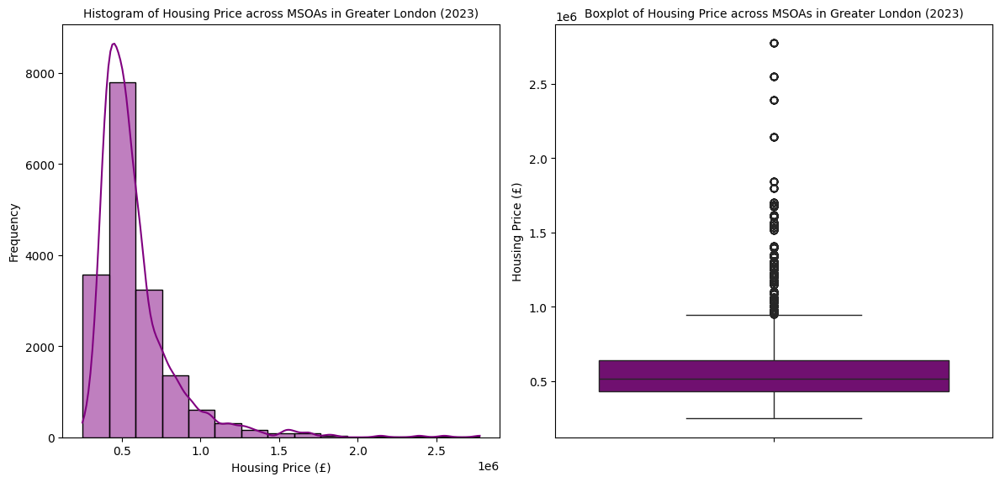

In [54]:
plt.figure(figsize=(12, 6)) #set the figure size

# Histogram of Housing Price
plt.subplot(1,2,1) # Set the number and the position of plots in the figure
sns.histplot(Housing_Industry_Greater_London['Housing Price'], bins=15, kde= True, color='purple') # Set the data, number of bins and their color in the histogram, add kde for overlay a smooth line of data disturbtion
plt.title('Histogram of Housing Price across MSOAs in Greater London (2023)', fontsize=10) # Set the plot tiltle and font size
plt.xlabel('Housing Price (£)') # Set the x label
plt.ylabel('Frequency') # Set the y label

# Bopxplot of Housing Price
plt.subplot(1,2,2) # Set the number and the position of plots in the figure
sns.boxplot(y=Housing_Industry_Greater_London['Housing Price'], color='purple') # Set the data, number of bins and their color in the histogram, add kde for overlay a smooth line of data disturbtion
plt.title('Boxplot of Housing Price across MSOAs in Greater London (2023)', fontsize=10) # Set plot title and font size
plt.ylabel('Housing Price (£)') # Set the y label

plt.tight_layout() # Automatic layout improvements
plt.show() # Plot

The histogram and boxplot visualise the distribution of housing prices across MSOAs in Greater London (2023). 

Focusing on the histogram reveals a wide range of housing prices and also a right skew in the plot despite the closeness of mean (£585,162) and the median (50%:  £516,500) in the earlier statistical summary, maybe due to outliers. 

In dealing with outliers of the housing prices, I considered applied three options in the process of doing this mini-project: deleting them, keeping them as they were, or applying Tukey’s method (Tukey, 1970):
- Deleting outliers resulted in the loss of valuable data, particularly from high-priced areas like the City of London, which are crucial for understanding the housing market.
- Keeping them unchanged led to bias, distorting the model and violating the assumptions required for reliable linear modeling.
- Applying Tukey’s method changed the shape of the data by compressing values into the last bin, reducing variability at the higher end.

Since all three options had drawbacks, I decided that Tukey’s method was the best compromise. It allowed me to retain high housing price trends while minimising their impact on the model, ensuring a more balanced and reliable analysis.

In [55]:
# Calculate Q1, Q3, and IQR
Q1 = Housing_Industry_Greater_London['Housing Price'].quantile(0.25)
Q3 = Housing_Industry_Greater_London['Housing Price'].quantile(0.75)
IQR = Q3 - Q1

# Calculate the upper threshold for outliers
upper_threshold = Q3 + 1.5 * IQR

In [56]:
# Replace values above the threshold with the threshold value
Housing_Industry_Greater_London['Housing Price'] = Housing_Industry_Greater_London['Housing Price'].apply(lambda x: min(x, upper_threshold))

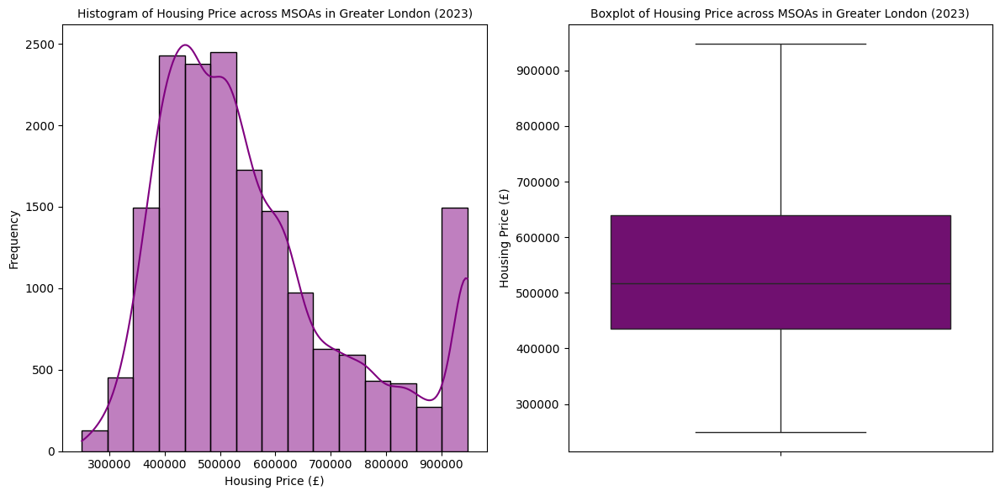

In [57]:
# Re-plot the histogram and boxplot for the filtered dataset
plt.figure(figsize=(12, 6)) #set the figure size

# Histogram of Housing Price
plt.subplot(1,2,1) # Set the number and the position of plots in the figure
sns.histplot(Housing_Industry_Greater_London['Housing Price'], bins=15, kde= True, color='purple') # Set the data, number of bins and their color in the histogram, add kde for overlay a smooth line of data disturbtion
plt.title('Histogram of Housing Price across MSOAs in Greater London (2023)', fontsize=10) # Set the plot tiltle and font size
plt.xlabel('Housing Price (£)') # Set the x label
plt.ylabel('Frequency') # Set the y label

# Bopxplot of Housing Price
plt.subplot(1,2,2) # Set the number and the position of plots in the figure
sns.boxplot(y=Housing_Industry_Greater_London['Housing Price'], color='purple') # Set the data, number of bins and their color in the histogram, add kde for overlay a smooth line of data disturbtion
plt.title('Boxplot of Housing Price across MSOAs in Greater London (2023)', fontsize=10) # Set plot title and font size
plt.ylabel('Housing Price (£)') # Set the y label

plt.tight_layout() # Automatic layout improvements
plt.show() # Plot

Currently, the right side of the histogram looks changed in shape compared to how it was before. This suggests that the highest housing prices were kept using the Tukey method. While this helped control extreme values, it also compressed the highest prices in less number of bins, which might create bias in the data. Yet, all in all, it still seems the most appropriate strategy, for now.

Given the wide range of employment data observed in the statistical summary above, the distribution of employee numbers in MSOAs is visualised by industries rather than analyzing the entire dataset as a whole:

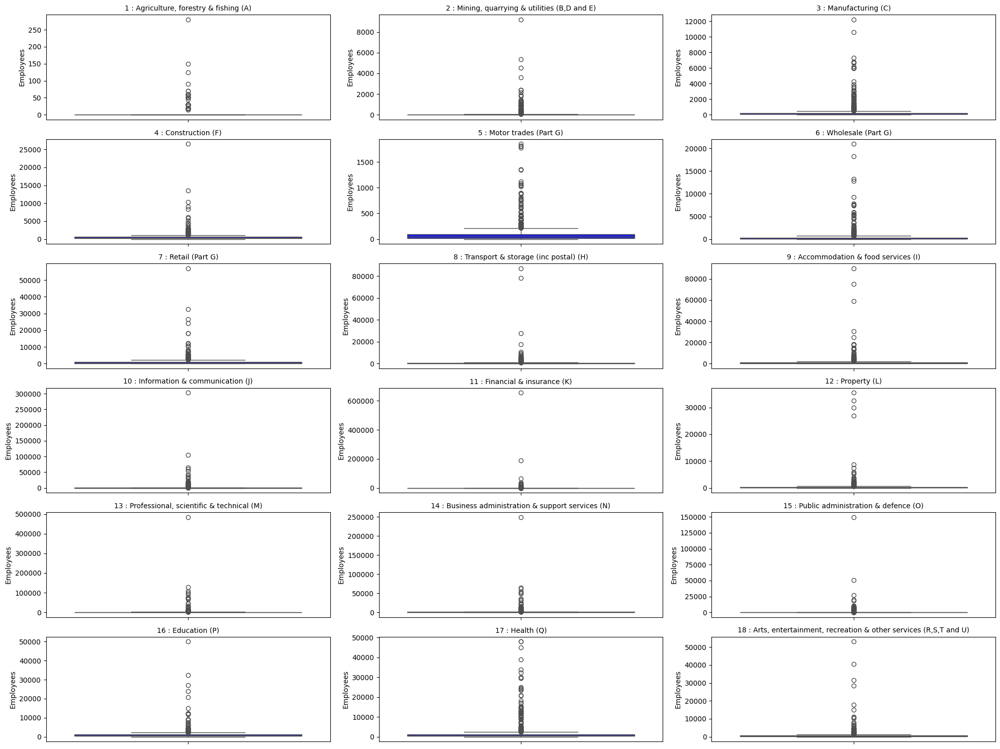

In [58]:
# Set the figure size
plt.figure(figsize=(20, 15))

# Loop through all industries
industries = Housing_Industry_Greater_London['Industry'].unique()
for i, industry in enumerate(industries, 1):  # Enumerate to create subplots
    plt.subplot(6, 3, i)  # Adjust grid size (6 rows, 3 columns for 18 plots)
    sns.boxplot(data=Housing_Industry_Greater_London[Housing_Industry_Greater_London['Industry'] == industry], 
                y='Employees', color='blue')
    plt.title(industry, fontsize=10)  # Set industry name as title
    plt.ylabel('Employees')  # Set y-axis label
    plt.xlabel('')  # Remove x-axis label for clarity

plt.tight_layout()  # Adjust layout to avoid overlaps
plt.show()


The boxplots above illustrate the distribution of employee numbers across various industries in Greater London, revealing the presence of outliers in nearly every sector. These outliers reflect real employment patterns rather than errors, showing areas with exceptionally high job concentrations. Since they provide important insights into industry-specific employment trends, they will be kept in the analysis.

Note: Different methods, including outlier removal and the Tukey method, were tested before making this decision. However, removing outliers caused the loss of MSOAs with unique economic characteristics, especially in Central London.

To apply the necessary changes and support the next steps in the analysis, a pivot table has been created from the cleaned dataset.

In [59]:
Housing_Industry_Greater_London.head()

,Local authority code,Local authority name,MSOA code,MSOA name,Housing Price,Industry,Employees
5854,E09000001,City of London,E02000001,City of London 001,890000.0,"1 : Agriculture, forestry & fishing (A)",90
5854,E09000001,City of London,E02000001,City of London 001,890000.0,"2 : Mining, quarrying & utilities (B,D and E)",9200
5854,E09000001,City of London,E02000001,City of London 001,890000.0,3 : Manufacturing (C),10600
5854,E09000001,City of London,E02000001,City of London 001,890000.0,4 : Construction (F),26500
5854,E09000001,City of London,E02000001,City of London 001,890000.0,5 : Motor trades (Part G),290


In [60]:
# Create Pivot Table
pivot_table_Industry = Housing_Industry_Greater_London.pivot(index = 'MSOA code', columns ='Industry', values = 'Employees')



In [61]:
# Join 'Housing Price' into Pivot Table
pivot_table_IndustryHousing0= pivot_table_Industry.join(Housing_Industry_Greater_London.set_index('MSOA code'), on = 'MSOA code',how='left')

pivot_table_IndustryHousing0.head()

,"1 : Agriculture, forestry & fishing (A)",10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)",...,6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),Local authority code,Local authority name,MSOA name,Housing Price,Industry,Employees
MSOA code,,,,,,,,,,,,,,,,,,,,,
E02000001,90,303000,655000,32500,484000,249000,5200,20750,45000,40500,...,21000,18000,17600,59000,E09000001,City of London,City of London 001,890000.0,"1 : Agriculture, forestry & fishing (A)",90
E02000001,90,303000,655000,32500,484000,249000,5200,20750,45000,40500,...,21000,18000,17600,59000,E09000001,City of London,City of London 001,890000.0,"2 : Mining, quarrying & utilities (B,D and E)",9200
E02000001,90,303000,655000,32500,484000,249000,5200,20750,45000,40500,...,21000,18000,17600,59000,E09000001,City of London,City of London 001,890000.0,3 : Manufacturing (C),10600
E02000001,90,303000,655000,32500,484000,249000,5200,20750,45000,40500,...,21000,18000,17600,59000,E09000001,City of London,City of London 001,890000.0,4 : Construction (F),26500
E02000001,90,303000,655000,32500,484000,249000,5200,20750,45000,40500,...,21000,18000,17600,59000,E09000001,City of London,City of London 001,890000.0,5 : Motor trades (Part G),290


In [62]:
pivot_table_IndustryHousing0.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17334 entries, E02000001 to E02006931
Data columns (total 24 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   1 : Agriculture, forestry & fishing (A)                              17334 non-null  Int64  
 1   10 : Information & communication (J)                                 17334 non-null  Int64  
 2   11 : Financial & insurance (K)                                       17334 non-null  Int64  
 3   12 : Property (L)                                                    17334 non-null  Int64  
 4   13 : Professional, scientific & technical (M)                        17334 non-null  Int64  
 5   14 : Business administration & support services (N)                  17334 non-null  Int64  
 6   15 : Public administration & defence (O)                             17334 non-null  Int64  
 7

In [63]:
# Drop 'Industry' and 'Employees' columns
pivot_table_IndustryHousing0.drop(columns=['Industry', 'Employees'], inplace=True)

# Sum total employees
pivot_table_IndustryHousing0['Total_MSOA-Employees'] = pivot_table_IndustryHousing0.iloc[:, 0:18].sum(axis=1)



In [64]:
# Drop duplicates
pivot_table_IndustryHousing0 = pivot_table_IndustryHousing0.drop_duplicates()

In [65]:
pivot_table_IndustryHousing0.head()

,"1 : Agriculture, forestry & fishing (A)",10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)",...,5 : Motor trades (Part G),6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),Local authority code,Local authority name,MSOA name,Housing Price,Total_MSOA-Employees
MSOA code,,,,,,,,,,,,,,,,,,,,,
E02000001,90,303000,655000,32500,484000,249000,5200,20750,45000,40500,...,290,21000,18000,17600,59000,E09000001,City of London,City of London 001,890000.0,1997230
E02000002,0,105,0,45,90,220,0,55,450,120,...,65,120,290,135,750,E09000002,Barking and Dagenham,Barking and Dagenham 001,387500.0,2955
E02000003,0,285,70,150,455,675,0,925,1325,1725,...,380,1050,1325,230,1175,E09000002,Barking and Dagenham,Barking and Dagenham 002,432500.0,10970
E02000004,0,30,0,290,75,450,0,1800,225,50,...,15,0,190,60,190,E09000002,Barking and Dagenham,Barking and Dagenham 003,430000.0,3730
E02000005,0,120,20,35,155,90,0,1500,160,125,...,85,150,450,105,365,E09000002,Barking and Dagenham,Barking and Dagenham 004,385000.0,3930


In [66]:
# Check potential null values in the DataFrame after pivot and join
pivot_table_IndustryHousing0.isnull().sum()

1 : Agriculture, forestry & fishing (A)                                0
10 : Information & communication (J)                                   0
11 : Financial & insurance (K)                                         0
12 : Property (L)                                                      0
13 : Professional, scientific & technical (M)                          0
14 : Business administration & support services (N)                    0
15 : Public administration & defence (O)                               0
16 : Education (P)                                                     0
17 : Health (Q)                                                        0
18 : Arts, entertainment, recreation & other services (R,S,T and U)    0
2 : Mining, quarrying & utilities (B,D and E)                          0
3 : Manufacturing (C)                                                  0
4 : Construction (F)                                                   0
5 : Motor trades (Part G)                          

In [67]:
# Columns to process (all industry columns)
p_columns = [
    '1 : Agriculture, forestry & fishing (A)',
    '2 : Mining, quarrying & utilities (B,D and E)',
    '3 : Manufacturing (C)',
    '4 : Construction (F)',
    '5 : Motor trades (Part G)',
    '6 : Wholesale (Part G)',
    '7 : Retail (Part G)',
    '8 : Transport & storage (inc postal) (H)',
    '9 : Accommodation & food services (I)',
    '10 : Information & communication (J)',
    '11 : Financial & insurance (K)',
    '12 : Property (L)',
    '13 : Professional, scientific & technical (M)',
    '14 : Business administration & support services (N)',
    '15 : Public administration & defence (O)',
    '16 : Education (P)',
    '17 : Health (Q)',
    '18 : Arts, entertainment, recreation & other services (R,S,T and U)',
]

/var/folders/wd/1wf586s93vg1fbnl295w_w1r0000gn/T/ipykernel_74498/3400809140.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pivot_table_IndustryHousing0[p_columns].sum().reset_index(), x='index', y=0, palette= 'Set3') # Set first 17 columns (Industry specific) columns as data, use sum to add up industry values, usex indexes (industry names) as x and


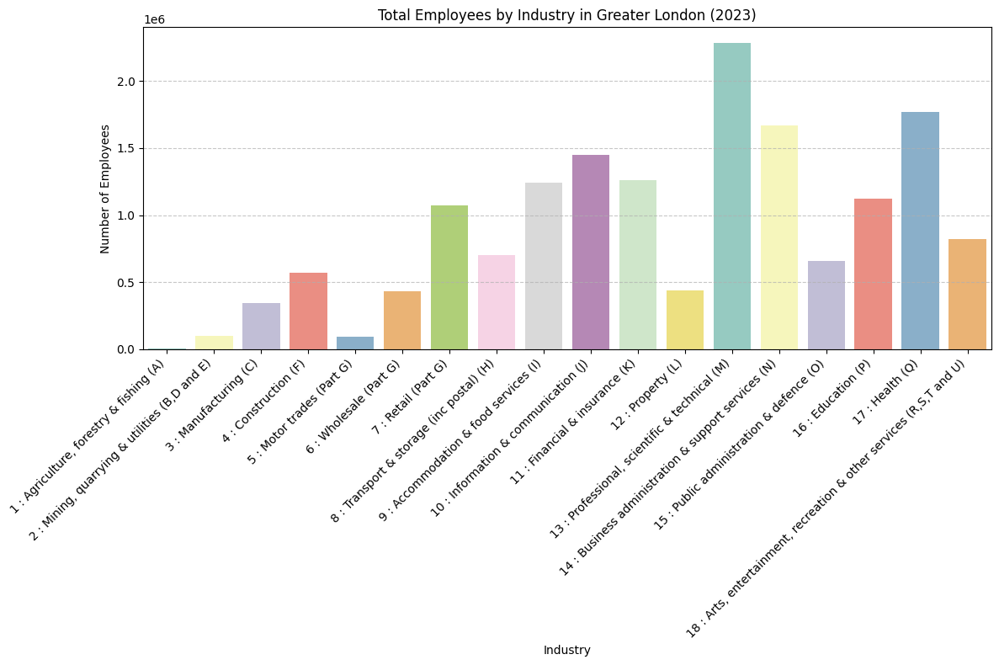

In [68]:
# Barplot
plt.figure(figsize=(12, 8))  # Set figure size
sns.barplot(data=pivot_table_IndustryHousing0[p_columns].sum().reset_index(), x='index', y=0, palette= 'Set3') # Set first 17 columns (Industry specific) columns as data, use sum to add up industry values, usex indexes (industry names) as x and   

plt.title('Total Employees by Industry in Greater London (2023)') # Set plot title
plt.xlabel('Industry') # Set x label
plt.ylabel('Number of Employees') # Set y label
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better presentation
plt.grid(axis='y', linestyle='--', alpha=0.7) # Dashed transparent gridlines 

plt.tight_layout()
plt.show()

The bar chart shows the total number of employees in different industries across Greater London in 2023. Some industries, like professional, scientific & technical services and health, have the highest number of employees, with over 2 million and 1.5 million workers, respectively. Financial & insurance services, education, and retail also employ a large number of people. On the other hand, agriculture, mining, and utilities have the fewest employees, indicating that these sectors play a smaller role in London's economy. This distribution highlights how Greater London’s job market is mainly concentrated in service-based industries, while traditional sectors like manufacturing and agriculture have a much smaller workforce.

<Figure size 2000x1000 with 0 Axes>

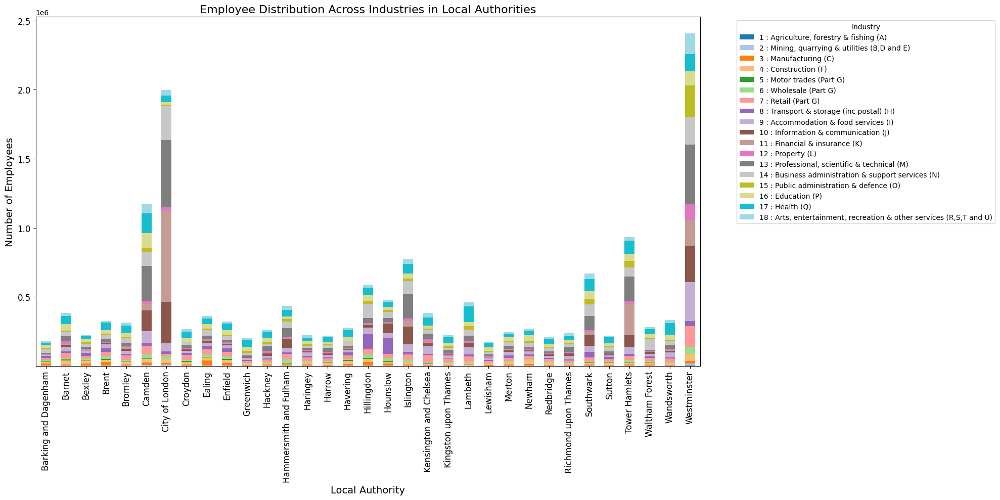

In [69]:
# Group data by Local Authority and sum employees for each industry
industry_distribution = pivot_table_IndustryHousing0.groupby("Local authority name")[p_columns].sum()

# Create stacked bar chart
plt.figure(figsize=(20, 10))
industry_distribution.plot(kind='bar', stacked=True, colormap='tab20', figsize=(20, 10))
plt.title('Employee Distribution Across Industries in Local Authorities', fontsize=16)
plt.xlabel('Local Authority', fontsize=14)
plt.ylabel('Number of Employees', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Industry', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

The stacked bar chart displays the distribution of employees across different industries in various local authorities in Greater London. Each bar represents a local authority, with different colors showing the number of employees in specific industries.
Key observations:
- City of London, Westminster, and Camden have the highest total employment, with a strong presence in financial, business, and professional services.
- Boroughs such as Bexley, Bromley, and Redbridge have smaller employment figures, suggesting a lower concentration of major industries.

This visualisation highlights the centralization of business and financial activities in inner London while showing more balanced employment across different sectors in outer boroughs.

### Correlation Analysis

In [70]:
Housing_Industry_Greater_London.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17334 entries, 5854 to 6855
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Local authority code  17334 non-null  object 
 1   Local authority name  17334 non-null  object 
 2   MSOA code             17334 non-null  object 
 3   MSOA name             17334 non-null  object 
 4   Housing Price         17334 non-null  float64
 5   Industry              17334 non-null  object 
 6   Employees             17334 non-null  Int64  
dtypes: Int64(1), float64(1), object(5)
memory usage: 1.1+ MB


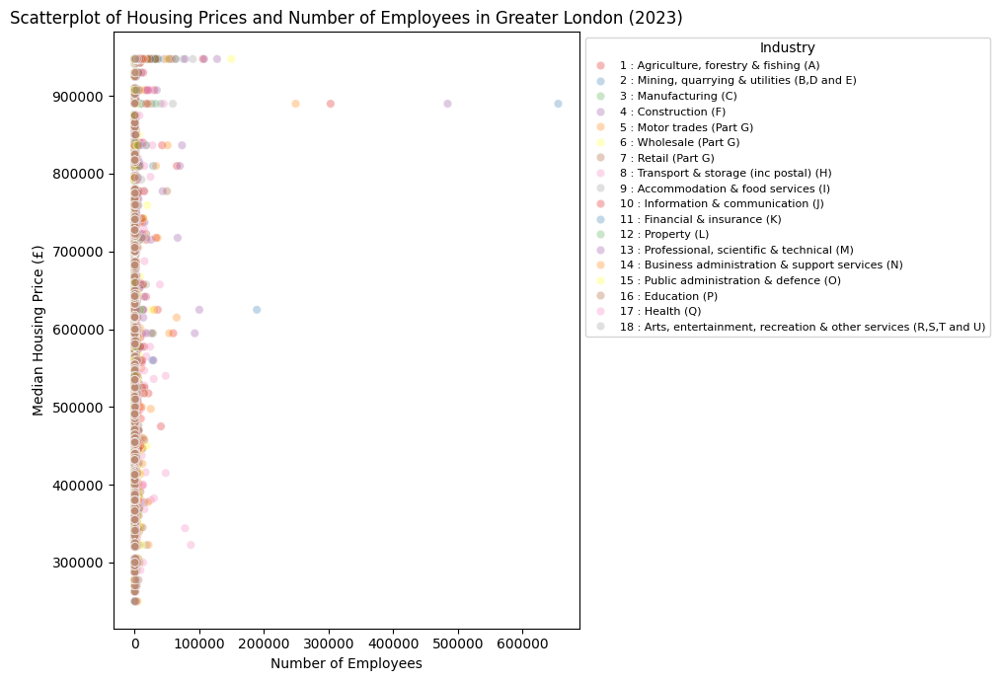

In [71]:
#Scatterplot
fig, ax = plt.subplots(figsize=(10, 7)) #set the figure size
sns.scatterplot(data=Housing_Industry_Greater_London, x='Employees', y='Housing Price', hue='Industry',palette='Set1', alpha=0.3) #set the details of the plot (data, x,y values, hue, and color platte)

plt.title('Scatterplot of Housing Prices and Number of Employees in Greater London (2023)') #set the title
plt.xlabel('Number of Employees') #set x label
plt.ylabel('Median Housing Price (£)') #set y label
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Industry', fontsize=8) #move the legend outside the plot

plt.ticklabel_format(style='plain', axis='y')  # Format y-axis to show plain numbers

plt.tight_layout() #automatic layout improvements
plt.show() #plot

In [72]:
# Calculate total employees for each MSOA
MSOA_total_employees=Housing_Industry_Greater_London.groupby('MSOA code')['Employees'].sum().reset_index()

# Create a subset that presents Housing Price and Total Employees in MSOAs (by join)
GL_Housing_TotalEmployee = MSOA_total_employees.join(Housing_Industry_Greater_London[['MSOA code', 'Housing Price']].set_index('MSOA code'), on='MSOA code', how='inner')

# Check on the new dataset
GL_Housing_TotalEmployee .head()

,MSOA code,Employees,Housing Price
0,E02000001,1997230,890000.0
0,E02000001,1997230,890000.0
0,E02000001,1997230,890000.0
0,E02000001,1997230,890000.0
0,E02000001,1997230,890000.0


In [73]:
# Drop duplicates
GL_Housing_TotalEmployee= GL_Housing_TotalEmployee.drop_duplicates()

# Rename 'Employees' column to 'Total_Employees'
GL_Housing_TotalEmployee = GL_Housing_TotalEmployee.rename(columns={'Employees': 'Total_Employees'})

# Recheck the heading
GL_Housing_TotalEmployee .head()

,MSOA code,Total_Employees,Housing Price
0,E02000001,1997230,890000.0
1,E02000002,2955,387500.0
2,E02000003,10970,432500.0
3,E02000004,3730,430000.0
4,E02000005,3930,385000.0


In [74]:
GL_Housing_TotalEmployee.info()

<class 'pandas.core.frame.DataFrame'>
Index: 963 entries, 0 to 962
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MSOA code        963 non-null    object 
 1   Total_Employees  963 non-null    Int64  
 2   Housing Price    963 non-null    float64
dtypes: Int64(1), float64(1), object(1)
memory usage: 31.0+ KB


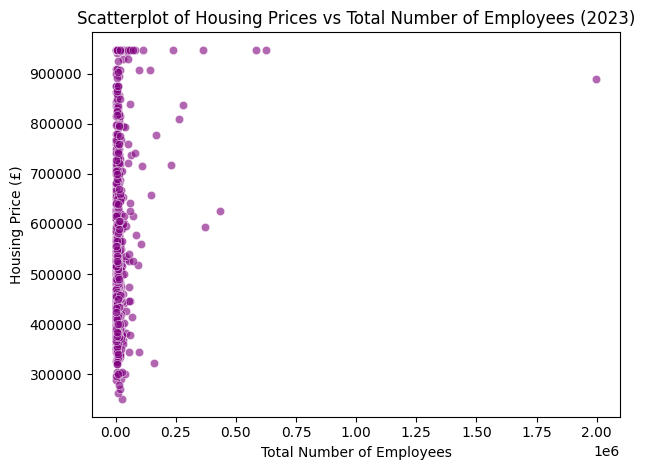

In [75]:
# Scatter plot for Housing Prica and Total Employees
plt.figure() 
sns.scatterplot(data= GL_Housing_TotalEmployee , x='Total_Employees', y='Housing Price', alpha=0.6, color='purple')  # Set data and appearance

# Add labels and title
plt.title('Scatterplot of Housing Prices vs Total Number of Employees (2023)', fontsize=12)
plt.xlabel('Total Number of Employees')  
plt.ylabel('Housing Price (£)')  

plt.tight_layout()  # Adjust layout
plt.show()  # Display the plot


Although it was previously decided not to remove MSOA employee numbers as outliers, the scatterplot above reveals that after modifying housing prices and dropping housing outliers, one data point appears extremely distant from the rest. This point represents an exceptionally high employment number while still maintaining a housing price within the dataset's range. Given that all other data points cluster closely together, this single outlier disrupts the overall distribution and may impact analysis results.
To ensure a more accurate interpretation of the relationship between housing prices and employment numbers, I will remove this single extreme case while keeping the rest of the dataset intact. This adjustment will refine the visualisation and analysis without significantly altering the overall trend.

In [76]:
pivot_table_IndustryHousing0.columns

Index(['1 : Agriculture, forestry & fishing (A)',
       '10 : Information & communication (J)',
       '11 : Financial & insurance (K)', '12 : Property (L)',
       '13 : Professional, scientific & technical (M)',
       '14 : Business administration & support services (N)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)',
       '18 : Arts, entertainment, recreation & other services (R,S,T and U)',
       '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '4 : Construction (F)',
       '5 : Motor trades (Part G)', '6 : Wholesale (Part G)',
       '7 : Retail (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)', 'Local authority code',
       'Local authority name', 'MSOA name', 'Housing Price',
       'Total_MSOA-Employees'],
      dtype='object')

In [77]:
# Identify the row with the highest total number of employees
max_employee_value = GL_Housing_TotalEmployee['Total_Employees'].max()

# Drop the row where this value appears
GL_Housing_TotalEmployee = GL_Housing_TotalEmployee[GL_Housing_TotalEmployee['Total_Employees'] != max_employee_value]

In [78]:
# Find the max employee value
max_employee_value = pivot_table_IndustryHousing0['Total_MSOA-Employees'].max()

# Drop the row where this value appears
pivot_table_IndustryHousing0 = pivot_table_IndustryHousing0[pivot_table_IndustryHousing0['Total_MSOA-Employees'] != max_employee_value]


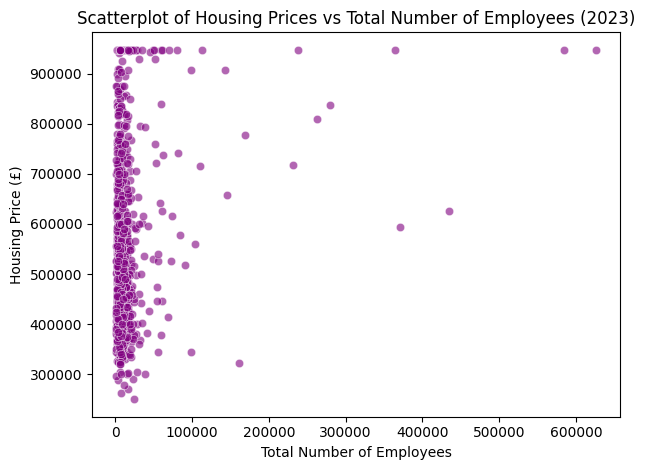

In [79]:
# Replot the Scatter plot for Housing Prica and Total Employees
plt.figure() 
sns.scatterplot(data= GL_Housing_TotalEmployee , x='Total_Employees', y='Housing Price', alpha=0.6, color='purple')  # Set data and appearance

# Add labels and title
plt.title('Scatterplot of Housing Prices vs Total Number of Employees (2023)', fontsize=12)
plt.xlabel('Total Number of Employees')  
plt.ylabel('Housing Price (£)')  

plt.tight_layout()  # Adjust layout
plt.show()  # Display the plot

Before proceeding statistical analysis, normality test is conducted to validate the initial observations  over  non-normal distribution of 'Housing Price' and 'Employees' in the statistical description and visualisation above.

Given the data frame size (17,334 records in Housing_Industry_Greater_London data frame), the Anderson-Darling test is selected as it is better suited for larger datasets compared to the Shapiro-Wilk test, which is recommended for smaller samples.

Hypotheses for Normality Test:
Null hypothesis (H₀): The data follows a normal distribution.
Alternative hypothesis (H₁): The data does not follow a normal distribution.

P-value threshold of 0.05:
If p > 0.05, a failure to reject H₀, indicating the data may be normally distributed.
If p ≤ 0.05, rejectinh H₀, indicating the data is not normally distributed.

In [80]:
# Anderson-Darling Test
from scipy import stats
print('Housing_Price',stats.anderson(Housing_Industry_Greater_London['Housing Price'], dist='norm'))
print('Employees',stats.anderson(Housing_Industry_Greater_London['Employees'], dist='norm'))

Housing_Price AndersonResult(statistic=np.float64(529.1733248386154), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(560830.2009345795), scale=np.float64(171864.5900239433))
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Employees AndersonResult(statistic=np.float64(5406.687403674841), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(924.4184839044652), scale=np.float64(8001.504990405369))
 success: True
 message: '`anderson` successfully fit the distribution to the data.')


The test statistic for Housing Price at 0.05 significance level is 529.17, which is higher than the critical value of 0.787. This means rejecting the null hypothesis (H₀) and cocluding that housing prices are not normally distributed.

For Employees, the test statistic is 5406.68, also above the 0.787 threshold. The null hypothesis (H₀) is rejected for the emplyess data distribution; showing that employees are not normally distributed either.

These results match earlier observations and graphs, which showed skewed data. Therefore, and given the non-normal distributions, non-parametric tests are chosen for further analysis.

Additionally, to account for the possibility of a different distribution pattern in the total number of employees within MSOAs, applying normality test to the total number of employees sounds logical, too. However, due to the smaller size of records in this dataset, the Shapiro-Wilk Normality Test with the same hypothesis above is chosen:

In [81]:
# Shapiro-Wilk Normality Test for Total Employees
stat, p_value_Total_Employees = shapiro(GL_Housing_TotalEmployee['Total_Employees'])
print("Shapiro-Wilk Test p-value:", p_value_Total_Employees)

Shapiro-Wilk Test p-value: 2.4892325111420868e-52


As it was expected, the total employess data distribution does not follow normal distribution, either (Shapiro-Wilk Test p-value ≤ 0.05).

Now, acknowledging the non-normal distribution of the data, the datasets are further explored to answer the research questions through appropriate statistical and analytical methods.

The first question to respond is to examine if housing prices in Greater London differs due to local employees counts. Answering this question may help revealing further patterns between workforce concentration and housing values. 

To test this, the Mann-Whitney U Test is applied with the following hypotheses:

- H₀ (Null Hypothesis): Housing prices do not differ significantly between areas with high and low employee numbers.
- H₁ (Alternative Hypothesis): Housing prices differ significantly between areas with high and low employee numbers.

Like above P-value threshold is considered 0.05. Therefore,p-value ≤ 0.05, rejects H₀, while p-value> 0.05 leads to failure in rejecting H₀.

Inorder to apply the test, MSOAs are categorised into two groups of higher and lower number of employees, comparing with the average (median, due to non-normal distribution):
 

In [82]:
# Categorize MSOAs into high and low employee groups based on median total employees
median_total_employees = GL_Housing_TotalEmployee['Total_Employees'].median()

high_employees = GL_Housing_TotalEmployee[GL_Housing_TotalEmployee['Total_Employees'] > median_total_employees]
low_employees = GL_Housing_TotalEmployee[GL_Housing_TotalEmployee['Total_Employees'] <= median_total_employees]


In [83]:
# Apply Mann-Whitney U test
stat_mannwhitney, p_value_mannwhitney = mannwhitneyu(high_employees['Housing Price'], low_employees['Housing Price'])

# Print Results
print("Mann-Whitney U Test statistic:", stat_mannwhitney)
print("p-value:", p_value_mannwhitney)

Mann-Whitney U Test statistic: 125392.0
p-value: 0.024185016553096017


Since the p-value is less than 0.05, the null hypothesis (H₀) is rejected which leads to accepting the alternative hypothesis (H1). Therefore and to answer the first question of the research we can say that: There is a statistically significant difference in housing prices between areas with higher and lower employees in Greater London.

The results of the Mann-Whitney U test show that the higher numbers of employees experience different housing price patterns compared to areas with the lower numbers of employees. These differences can reflect the spatial and economic dynamics of urban zones, where housing prices may be influenced by the attributes of employment hubs and economic activities. However, the test does not reveal the exact nature of this relationship, whether areas with higher employee numbers tend to have higher or lower housing prices requires further exploration. To better understand these patterns, Scatterplots are used:

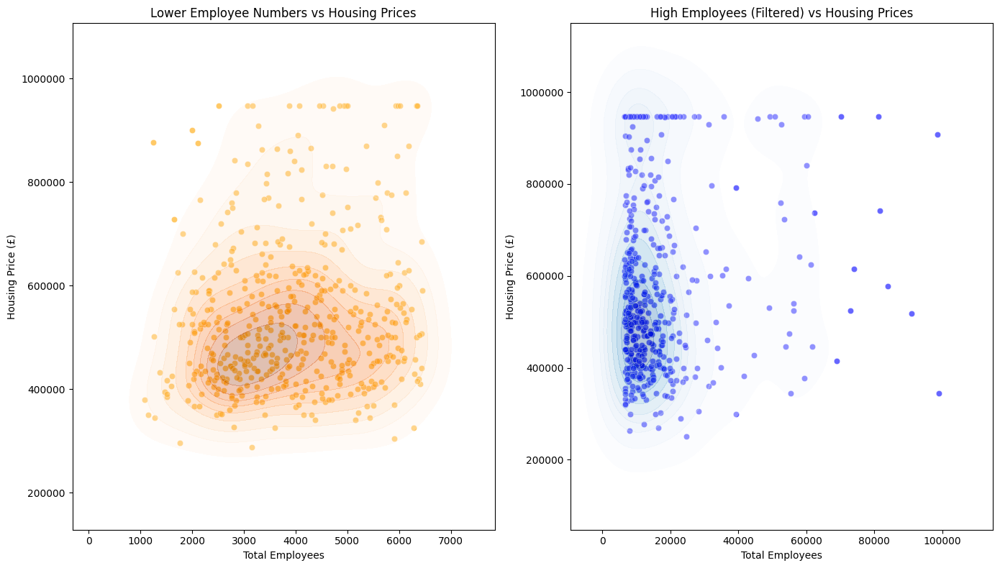

In [84]:
# Scatterplots of Housing Prices vs Employee Numbers

plt.figure(figsize=(14, 8))

# Lower Employees Areas
plt.subplot(1, 2, 1) 
sns.scatterplot(data=low_employees, x='Total_Employees', y='Housing Price', color='orange', alpha=0.6) # Set data, x and y axis, colour and transparency
sns.kdeplot(data=low_employees, x='Total_Employees', y='Housing Price', fill=True, cmap='Oranges', alpha=0.3)  # KDE layer
plt.title('Lower Employee Numbers vs Housing Prices') # set tiltle
plt.xlabel('Total Employees') # Set x label
plt.ylabel('Housing Price (£)') # Set y label
plt.ticklabel_format(style='plain', axis='both')  # Use plain numbers

# Higher Employees Areas
plt.subplot(1, 2, 2)
sns.scatterplot(data=high_employees[high_employees['Total_Employees'] < 100000], x='Total_Employees', y='Housing Price', color='blue', alpha=0.6) # Set data (limit higher values range to reduce outliers effect in visualisation), x and y axis, colour and transparency
sns.kdeplot(data=high_employees[high_employees['Total_Employees'] < 100000], x='Total_Employees', y='Housing Price', fill=True, cmap='Blues', alpha=0.3) # KDE overlay
plt.title('High Employees (Filtered) vs Housing Prices') # set tiltle
plt.xlabel('Total Employees') # Set x label
plt.ylabel('Housing Price (£)') # Set y label
plt.ticklabel_format(style='plain', axis='both')  # Use plain numbers

plt.tight_layout()
plt.show()


Two above scatterplots illustrate the Housing Prices (£) and Total Employee Numbers in two groups of fewer (the orange colour left polt) and higher (the right blue plot) number of employee  areas. Also the KDE (Kernel Density Estimation) plot is added to highlight concentrated areas in plots.

As it is displayed in the plots above and aslo examined in the Mann-Whitney U Test, the distribution pattern of housing price is different in areas with lower number of employees compared to the areas with higher numbers, however still no linear regression can be seen in initial observation:

Most data points in the Lower Employee Numbers plot are clustered approximately 2000 - 5000 employees and £400000 -£600000 for housing prices. While in the right plot, most data points are concentrated in lower that 20000 employees range and £300000- £700000. The housing market also seems to be more diverse in higher employee numbers areas compared to the areas with lower employees since the data distribuation is broader in the first mentioned group. 


In [85]:
pivot_table_IndustryHousing0.columns

Index(['1 : Agriculture, forestry & fishing (A)',
       '10 : Information & communication (J)',
       '11 : Financial & insurance (K)', '12 : Property (L)',
       '13 : Professional, scientific & technical (M)',
       '14 : Business administration & support services (N)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)',
       '18 : Arts, entertainment, recreation & other services (R,S,T and U)',
       '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '4 : Construction (F)',
       '5 : Motor trades (Part G)', '6 : Wholesale (Part G)',
       '7 : Retail (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)', 'Local authority code',
       'Local authority name', 'MSOA name', 'Housing Price',
       'Total_MSOA-Employees'],
      dtype='object')

In [86]:
# Drop descriptive columns
pivot_table_IndustryHousing=pivot_table_IndustryHousing0.drop(columns=['Local authority code', 'Local authority name', 'MSOA name'])

pivot_table_IndustryHousing.head()

,"1 : Agriculture, forestry & fishing (A)",10 : Information & communication (J),11 : Financial & insurance (K),12 : Property (L),"13 : Professional, scientific & technical (M)",14 : Business administration & support services (N),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"18 : Arts, entertainment, recreation & other services (R,S,T and U)","2 : Mining, quarrying & utilities (B,D and E)",3 : Manufacturing (C),4 : Construction (F),5 : Motor trades (Part G),6 : Wholesale (Part G),7 : Retail (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),Housing Price,Total_MSOA-Employees
MSOA code,,,,,,,,,,,,,,,,,,,,
E02000002,0,105,0,45,90,220,0,55,450,120,10,60,440,65,120,290,135,750,387500.0,2955
E02000003,0,285,70,150,455,675,0,925,1325,1725,60,465,675,380,1050,1325,230,1175,432500.0,10970
E02000004,0,30,0,290,75,450,0,1800,225,50,50,0,305,15,0,190,60,190,430000.0,3730
E02000005,0,120,20,35,155,90,0,1500,160,125,0,45,525,85,150,450,105,365,385000.0,3930
E02000007,0,95,0,45,125,1175,500,1375,750,975,450,45,800,0,45,875,225,295,370000.0,7775


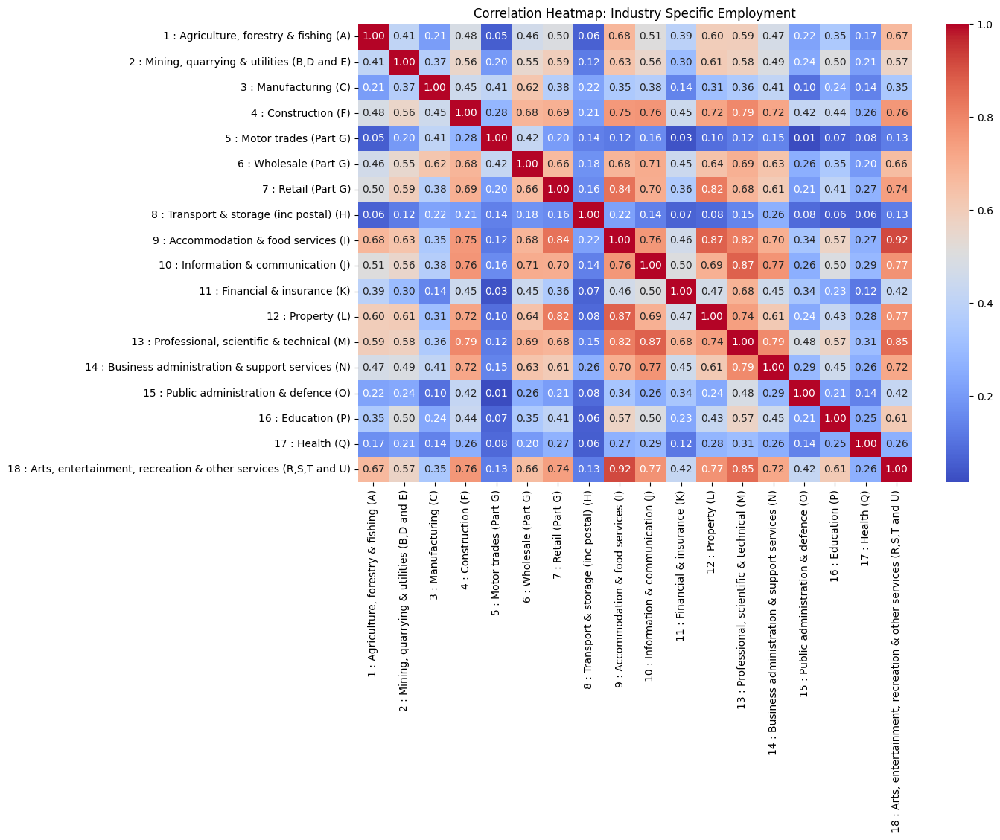

In [87]:
# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data = pivot_table_IndustryHousing0[p_columns].corr(), annot=True, fmt=".2f", cmap="coolwarm", cbar=True)

plt.title('Correlation Heatmap: Industry Specific Employment')
plt.show()

The heatmap shows how different industries in Greater London are related. A couple of industries have very high correlations (above 0.8), which can cause problems in the analysis by making the model less reliable. To fix this, only one industry employee numbers is kept from each highly related group, even though the selection process was challenging.

The following highly correlated columns are being removed from the dataset. However, the total number of employees in MSOAs stays the same because it is an important variable on its own and will not be used in the same analysis as industry-specific employees:

- 4 : Construction (F),
- 7 : Retail (Part G),
- 10 : Information & communication (J),
- 12 : Property (L),
- 13 : Professional, scientific & technical (M)
- 14 : Business administration & support services (N),
- 18 : Arts, entertainment, recreation & other services (R,S,T and U)




In [88]:
pivot_table_IndustryHousing0.columns

Index(['1 : Agriculture, forestry & fishing (A)',
       '10 : Information & communication (J)',
       '11 : Financial & insurance (K)', '12 : Property (L)',
       '13 : Professional, scientific & technical (M)',
       '14 : Business administration & support services (N)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)',
       '18 : Arts, entertainment, recreation & other services (R,S,T and U)',
       '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '4 : Construction (F)',
       '5 : Motor trades (Part G)', '6 : Wholesale (Part G)',
       '7 : Retail (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)', 'Local authority code',
       'Local authority name', 'MSOA name', 'Housing Price',
       'Total_MSOA-Employees'],
      dtype='object')

In [89]:
# List of columns to drop
columns_to_drop = ['4 : Construction (F)',
    '7 : Retail (Part G)',
    '10 : Information & communication (J)',
    '12 : Property (L)',
    '13 : Professional, scientific & technical (M)',
    '14 : Business administration & support services (N)',
    '18 : Arts, entertainment, recreation & other services (R,S,T and U)']
# Drop columns from pivot table
pivot_table_IndustryHousing0 = pivot_table_IndustryHousing0.drop(columns=columns_to_drop)


In [90]:
# Update p_columns to only existing columns
p_columns2 = [col for col in p_columns if col in pivot_table_IndustryHousing0.columns]


The heatmap is updated to check if there no highly correlated variables (above 0.8) be left in the data frame, as well as providing a sight on the correlation between industry employment numbers, total MSOA employees, and housing prices in Greater London:

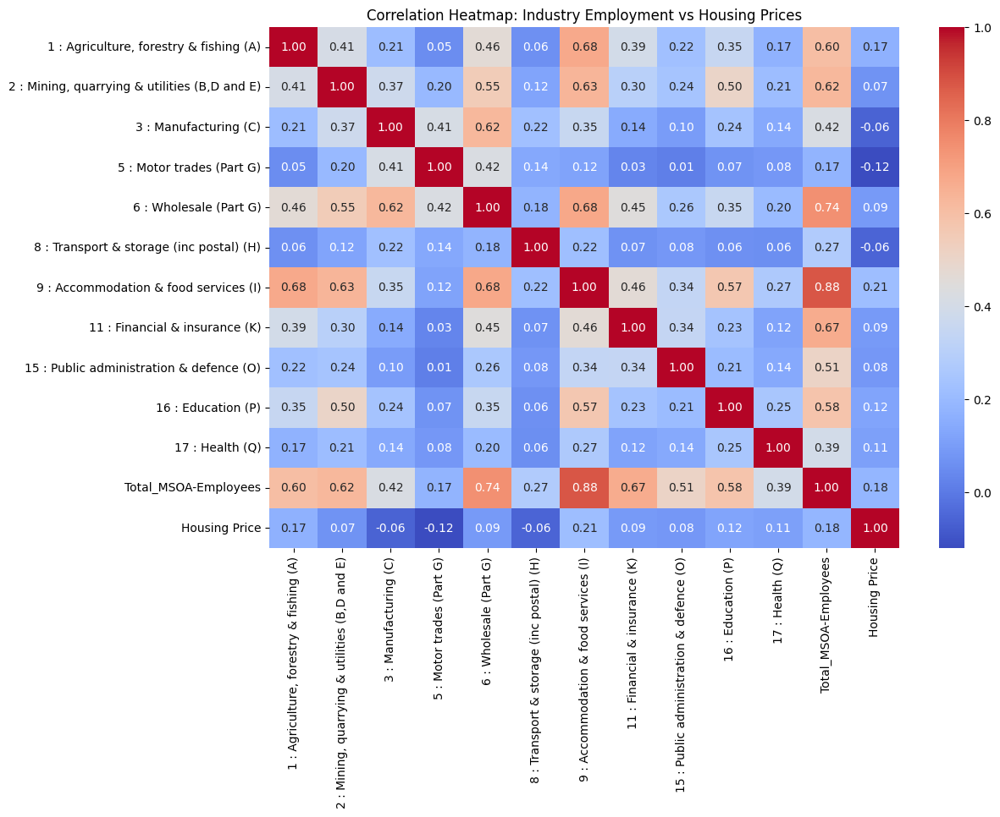

In [91]:
# Replot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data=pivot_table_IndustryHousing0[p_columns2 + ['Total_MSOA-Employees', 'Housing Price']].corr(), 
            annot=True, fmt=".2f", cmap="coolwarm", cbar=True)

plt.title('Correlation Heatmap: Industry Employment vs Housing Prices')
plt.show()

According to the heatmap output:

- Housing prices show very weak correlations with other variables, ranging from -0.12 to 0.22. Despite of being some weak positive correlations between housing prices and total MSOA employees, also some industries like 18 : Arts, entertainment, recreation & other services (R,S,T and U) and 1 : Agriculture, forestry & fishing (A), there are a couple of industries like 5 : Motor trades (Part G) with negative correlations with housing prices. All in all, housing prices are hardly correlated with either industry specific employees or total number of employees in MSOAs.

- In the matter of Total and Industry employee numbers, as it was expected due to the conceptual relation of the mentioned variables, no negative correltion is witnessed. Also, there are strong correlations between total MSOA employees and some industries like 11 : Financial & insurance (K) and 4 : Construction (F), while increases in the number of emplyee numbers in 5 : Motor trades (Part G) does not accompanying with increases in the total number of employees in MSOAs.


In [92]:
# Drop descriptive columns
pivot_table_IndustryHousing = pivot_table_IndustryHousing0.drop(columns=['Local authority code', 'Local authority name', 'MSOA name'])

pivot_table_IndustryHousing.columns

Index(['1 : Agriculture, forestry & fishing (A)',
       '11 : Financial & insurance (K)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)', '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '5 : Motor trades (Part G)',
       '6 : Wholesale (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)', 'Housing Price',
       'Total_MSOA-Employees'],
      dtype='object')

In [93]:
# Creat a subset of p_columns2 in the dataframe
pivot_table_IndustryHousing_P_C = pivot_table_IndustryHousing[p_columns2] 

pivot_table_IndustryHousing_P_C.columns

Index(['1 : Agriculture, forestry & fishing (A)',
       '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '5 : Motor trades (Part G)',
       '6 : Wholesale (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)',
       '11 : Financial & insurance (K)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)'],
      dtype='object')

### Clustering

#### *DBSCAN Analysis*
In order to answering the second and the third questions, understand potential clusters of similar data points based on employee numbers in different industries and MSOAs might be helpful. Therefore, the DBSCAN method is applied by regulating the eps (maximum neighborhood radius) and min_samples (minimum points to form a cluster) during trial and error attempts and comparing the number of noise points, clusters and also silhouette_scores. Since I have changed the parameters multiple times and keeping all the codes during the process of understanding the patterns in the notebook seemed unnecessary, only the last two group of codes (DBSCAN parameters) are retained as records to demonstrate how this process is taken place:

In [94]:
from sklearn.cluster import DBSCAN

In [95]:
dbscan100010 = DBSCAN(eps=1000, min_samples=10) # Set arbitrary eps (the threshold distance) and and minimum sample size

dbscan100010.fit(pivot_table_IndustryHousing_P_C) # Fit the model (Use pivot_table_IndustryHousing_P_C to only include 
                                                  # industry employee numbers, no housing no total employees)

dbscan_labels = dbscan100010.labels_ # Assign the labels to a new variable

pivot_table_IndustryHousing_P_C['dClusters100010'] = dbscan_labels # Add the clusters as a new column

pivot_table_IndustryHousing_P_C['dClusters100010'].value_counts()

dClusters100010
 0    717
-1    245
Name: count, dtype: int64

In [96]:
round(metrics.silhouette_score(pivot_table_IndustryHousing_P_C, dbscan_labels),3) # Calculate the Silhouette Score and round to 3 decimal place

np.float64(0.53)

In [97]:
pivot_table_IndustryHousing_P_C.drop(columns='dClusters100010', inplace=True)

In [98]:
dbscan150010 = DBSCAN(eps=1500, min_samples=10) # Set arbitrary eps (the threshold distance) and and minimum sample size

dbscan150010.fit(pivot_table_IndustryHousing_P_C) # Fit the model

dbscan_labels = dbscan150010.labels_ # Assign the labels to a new variable

pivot_table_IndustryHousing_P_C['dClusters150010'] = dbscan_labels # Add the clusters as a new column

pivot_table_IndustryHousing_P_C['dClusters150010'].value_counts()

dClusters150010
 0    784
-1    178
Name: count, dtype: int64

In [99]:
round(metrics.silhouette_score(pivot_table_IndustryHousing_P_C, dbscan_labels),3) # Calculate the Silhouette Score and round to 3 decimal place

np.float64(0.637)

In [100]:
pivot_table_IndustryHousing_P_C.drop(columns='dClusters150010', inplace=True)

In my attempt to cluster the dataset applying the DBSCAN method, different values of eps and min_samples are experimented hoping to understand how the clustering pattern changes and improve it through trial and error attempts. However, the result was still unsatisfactory, as the negative silhouette scores indicated an arbitrary distribution rather than meaningful clustering. Also and despite reaching positive and above 0.5 silhouette scores in the last couple of attemps, still the results were far from the concept of clustering since the whole observations were clustered in an only one cluster while multiple of points were dedicated as noises suggesting there would be no meaningful cluster if we have all the points in one group. Below is the results found by changing the parameters:


| DBSCAN Parameters       | Silhouette Score | Number of Clusters | Number of Noises (-1) |
|-------------------------|------------------|---------------------|-----------------------|
| eps=50, min_samples=10  | (-1)             | 0                   | 962                   |
| eps=10, min_samples=10  | (-1)             | 0                   | 962                   |
| eps=50, min_samples=30  | (-1)             | 0                   | 962                   |
| eps=100, min_samples=10 | (-1)             | 0                   | 962                   |
| eps=100, min_samples=30 | (-1)             | 0                   | 962                   |
| eps=200, min_samples=30 | (-1)             | 0                   | 962                   |
| eps=500, min_samples=10 | 0.216            | 1                   | 446                   |
| eps=1000, min_samples=10| 0.53             | 1                   | 245                   |
| eps=1500, min_samples=10| 0.637            | 1                   | 178                   |


Therefore, no efficient way of improving the DBSCAN parameters could see, wondering if there is no clear clusters in the dataset or maybe parameters selection was too weak to find out.

Considering this as a failure to identify potential clusters in the data frame, the k-distance graph (Ester et al., 1996) is used as a more systematic approach to select DBSCAN parameters; The goal of plotting the k-distance graph (Ester et al., 1996) is sorting the k-nearest neighbor distances and identifying the optimal eps value by using elbow method similar to its application in Lab 5 for K-Means clustering. The codes in this part to calculate the k-distances and plotting the graph in pythin are extracted from the guide on DBSCAN clustering in DataCamp (DataCamp, 2024):

In [101]:
from sklearn.neighbors import NearestNeighbors

In [102]:
# Function to plot k-distance graph (DataCamp, 2024)
def plot_k_distance_graph(df, k):

    # Fit Nearest Neighbors model
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(df)

    # Compute k-nearest neighbor distances
    distances, _ = neigh.kneighbors(df)
    
    # Sort distances in ascending order
    distances = np.sort(distances[:, k-1])

    # Plot the k-distance graph
    plt.figure()
    plt.plot(distances)
    plt.xlabel('Points sorted by distance')
    plt.ylabel(f'Distance to {k}-th nearest neighbor')
    plt.title(f'K-Distance Graph (k={k}) for DBSCAN')
    plt.grid()
    plt.show()

To determine the optimal eps value for DBSCAN, k-distance graphs using different values of k (5, 10, 20, 50 and 200) are generated below:

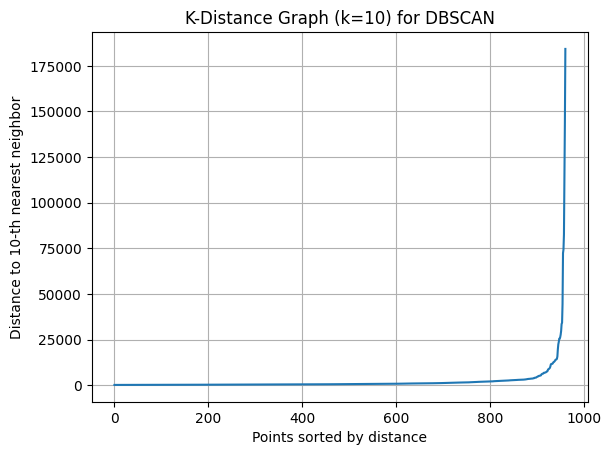

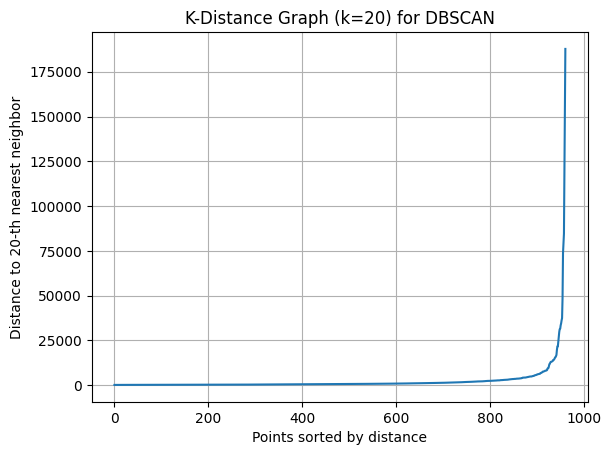

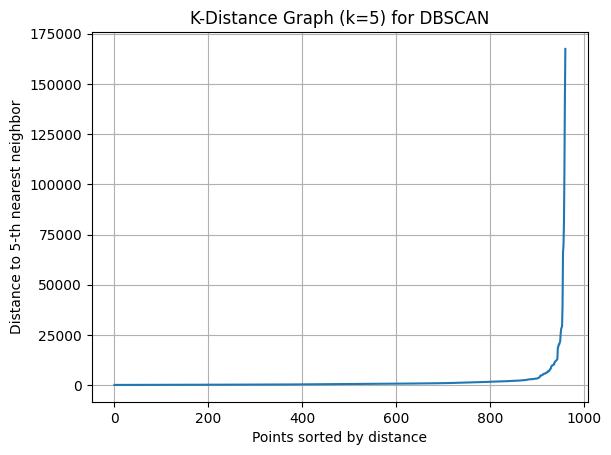

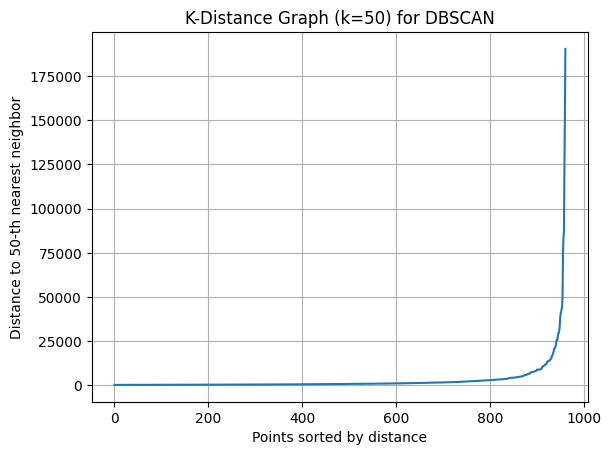

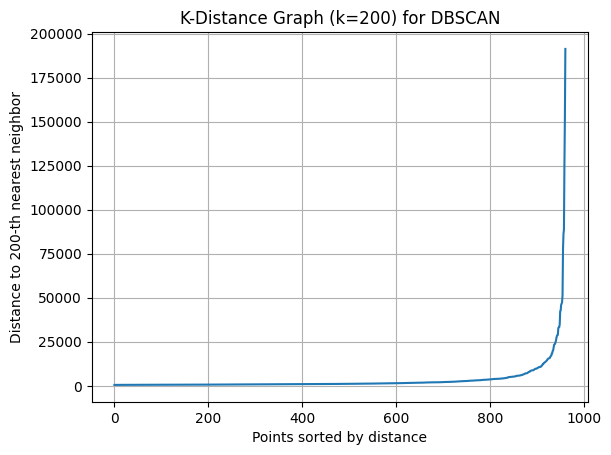

In [103]:
# Apply the function to the data frame and test different values for k (DataCamp, 2024)
plot_k_distance_graph(pivot_table_IndustryHousing_P_C, k=10) #set k=10
plot_k_distance_graph(pivot_table_IndustryHousing_P_C, k=20) #set k=20
plot_k_distance_graph(pivot_table_IndustryHousing_P_C, k=5) #set k=5
plot_k_distance_graph(pivot_table_IndustryHousing_P_C, k=50) #set k=50
plot_k_distance_graph(pivot_table_IndustryHousing_P_C, k=200) #set k=200

At the first glance, the elbow point in the graphs for k=5, k=10, and k=20  appeared in nearly the same position, raising question whether the method was effectively capturing variations in data density. When increasing k to 50, the graph showed a more gradual rise, though its overall shape remained similar. At k=200, the curve changed more noticeably, confirming that the method was functioning correctly.
However, since the elbow was clearer and more consistent in the graphs with lower k values, I chose to focus on those rather than k=200. In nearly all of the mentioned graphs, the y-axis value (distance to the k-th nearest neighbor) started increasing sharper around 10,000, suggesting that this might be a meaningful threshold for defining density-based clusters. Based on this observation, the eps is set up 10,000 for the first attempt.
Additionally, I chose min_samples = 28, following the recommendation in the DataCamp guide (Datacamp, 2024) that suggests setting min_samples to approximately twice the number of features:

In [104]:
pivot_table_IndustryHousing_P_C.columns

Index(['1 : Agriculture, forestry & fishing (A)',
       '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '5 : Motor trades (Part G)',
       '6 : Wholesale (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)',
       '11 : Financial & insurance (K)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)'],
      dtype='object')

In [105]:
dbscano1= DBSCAN(eps=10000, min_samples=28) 

dbscano1.fit(pivot_table_IndustryHousing_P_C) # Fit the model

dbscan_labels = dbscano1.labels_ # Assign the labels to a new variable

pivot_table_IndustryHousing_P_C['dClusterso1'] = dbscan_labels # Add the clusters as a new column

pivot_table_IndustryHousing_P_C['dClusterso1'].value_counts()


dClusterso1
 0    938
-1     24
Name: count, dtype: int64

In [106]:
round(metrics.silhouette_score(pivot_table_IndustryHousing_P_C, dbscan_labels),3) # Calculate the Silhouette Score and round to 3 decimal place

np.float64(0.905)

In [107]:
pivot_table_IndustryHousing_P_C.drop(columns='dClusterso1', inplace=True)

Applying DBSCAN with eps=10,000 and min_samples=28 as reached through a more structured process explained above, still was not sucessful due to the fact of creating only 1 cluster and despite the silhouette_score of near 1 (0.905) as somehow an ideal clustering value.
By adjusting the DBSCAN values, I aimed to create better-separated clusters. However, the result was still unsuccesful, either by only making one clusters or creating more clusters with lower than 0.5 silhouette scores. So, I ended up testing K-Means to find out if it might be a better clustering tool maybe due to the shape of the dataset:

#### *K-Mean Analysis*

In [108]:
import math 
from sklearn.cluster import KMeans

In [109]:
# Check the data frame length (number of observations)
len(pivot_table_IndustryHousing_P_C)

962

In [110]:
# Calculate the math square of the data frame length as start point fo the K-Means clustering
math.sqrt(len(pivot_table_IndustryHousing_P_C))

31.016124838541646

In [111]:
# Build the K-Means model for 31 clusters
kmeans31 = KMeans(n_clusters=31)

# Fit the K-Means model (with 31 clusters) to the dataset
kmeans31.fit(pivot_table_IndustryHousing_P_C)

# Define kmean_labels
kmeans_labels31 = kmeans31.labels_

# Calculate silhouette score
sil_31= metrics.silhouette_score(pivot_table_IndustryHousing_P_C, kmeans_labels31).round(3) #specify the data and the labels, and round it to 3 decimals

sil_31

np.float64(0.357)

In [112]:
# Define a column to allocate K-Means labels
pivot_table_IndustryHousing_P_C['kmeans_labels31']= kmeans_labels31

pivot_table_IndustryHousing_P_C['kmeans_labels31'].value_counts()


kmeans_labels31
11    595
0     164
24     53
19     37
10     31
8      17
18     16
20      7
13      6
27      6
25      5
28      2
12      2
9       2
5       2
30      2
6       1
1       1
26      1
7       1
14      1
17      1
3       1
4       1
21      1
16      1
22      1
23      1
15      1
29      1
2       1
Name: count, dtype: int64

In [113]:
# Count the number of clusters with only 1 observation in
(pivot_table_IndustryHousing_P_C['kmeans_labels31'].value_counts() == 1).sum()

np.int64(15)

In [114]:
# Max number of observation in one cluseter
(pivot_table_IndustryHousing_P_C['kmeans_labels31'].value_counts()).max()

np.int64(595)

In [115]:
#Drop the column from the dataset
pivot_table_IndustryHousing_P_C.drop(columns='kmeans_labels31', inplace=True)

Considering that the number of clusters (31) makes it challenging to interpret differences between them, and also 13 clusters contain only one observation (which resembles the concept of noise in DBSCAN clustering), it may be beneficial to reassess the choice of K. To ensure a more meaningful and interpretable clustering structure, the Elbow Method is applied to determine a more optimal number of clusters (K):

In [116]:
distortions = [] #create an empty list for distortion data
K = range(1,40) #the range of K values for the number of clusters 
for k in K: #for each value in K
    kmeanModel = KMeans(n_clusters=k) #build a K-Means clustering model
    kmeanModel.fit(pivot_table_IndustryHousing_P_C) #fit the model to the data frame
    distortions.append(kmeanModel.inertia_) #add the results to list of distortions 

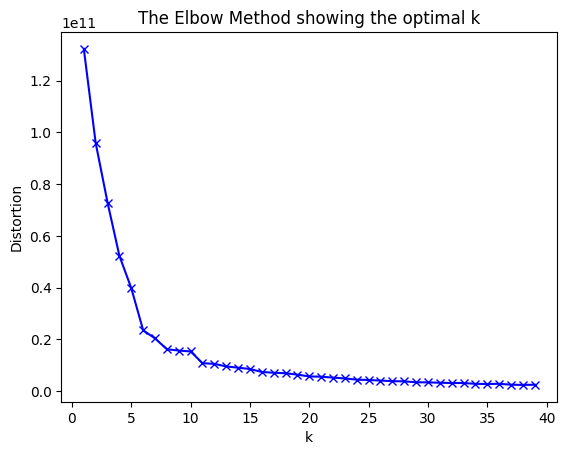

In [117]:
# Plot to find the optimal K by using elbow method
plt.figure()
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Applying the elbow method on the graph above shows that the sharpest decrease appears at k=2, suggesting it as the optimal number of clusters. However, to ensure the best clustering performance, k=3 was also tested, and the Silhouette Scores were compared at the end:

In [118]:
# Build th K-Means model for 3 clusters
kmeans3= KMeans(n_clusters=3)

# Fit the K-Means model (with 3 clusters) to the dataset
kmeans3.fit(pivot_table_IndustryHousing_P_C)

# Define kmean_labels
kmeans_labels3 = kmeans3.labels_

#calculate silhouette score
sil_3=metrics.silhouette_score(pivot_table_IndustryHousing_P_C, kmeans_labels3).round(3) #specify the data and the labels, and round it to 3 decimals
sil_3


np.float64(0.936)

In [119]:
# Define a column for set the K-Means labels and count the values
pivot_table_IndustryHousing_P_C['kmeans_labels3']= kmeans_labels3
pivot_table_IndustryHousing_P_C['kmeans_labels3'].value_counts()

kmeans_labels3
1    959
0      2
2      1
Name: count, dtype: int64

In [120]:
#Drop the column from the dataset
pivot_table_IndustryHousing_P_C.drop(columns='kmeans_labels3', inplace=True)

In [121]:
# Repeat building the K-Means model for 2 clusters
kmeans2 = KMeans(n_clusters=2)

# Repeat fiting the K-Means model (with 4 clusters) to the dataset
kmeans2.fit(pivot_table_IndustryHousing_P_C)

# Repeat definiong kmean_labels
kmeans_labels2 = kmeans2.labels_

# Calculate silhouette score
sil_2= metrics.silhouette_score(pivot_table_IndustryHousing_P_C, kmeans_labels2).round(3) #specify the data and the labels, and round it to 4 decimals

sil_2

np.float64(0.961)

In [122]:
# Define a column to set the K-Means labels and count the values
pivot_table_IndustryHousing_P_C['kmeans_labels2']= kmeans_labels2
pivot_table_IndustryHousing_P_C['kmeans_labels2'].value_counts()

kmeans_labels2
0    961
1      1
Name: count, dtype: int64

In [123]:
#Drop the column from the dataset
pivot_table_IndustryHousing_P_C.drop(columns='kmeans_labels2', inplace=True)

Below is the table summerising the reults from the K-Mean clustering:
| Number of Clusters (K) | Silhouette Score | Number of Clusters with only 1 observation | The max number of observations in one cluster
|------------------------|------------------|--------------------------------------------|--------------------------------------------
| 31                     | 0.361            | 13                                         |609
| 3                      | 0.954            | 1                                          |958
| 2                      | 0.961            | 1                                          |961

None of these clustering results seem to work well considering the total number of observations (962) and opbervations distribution across clusters. With K = 31, there are too many small clusters, including 13 with only one observation, while one cluster is much bigger with 609 observations, making it hard to compare groups. On the other hand, with K = 2 or K = 3, almost all observations are grouped into just one or two large clusters, even though the Silhouette Score is high. This makes the clusters too broad and less useful for analysis.
Since neither a very high nor a very low K seems to work well, I will try K = 8 next. This number is chosen somewhat randomly but expecting a better balance between having enough clusters to see differences while keeping them large enough to be meaningful:

In [124]:
# Repeat building the K-Means model for 8 clusters
kmeans8 = KMeans(n_clusters=8)

# Repeat fiting the K-Means model (with 6 clusters) to the dataset
kmeans8.fit(pivot_table_IndustryHousing_P_C)

# Repeat definiong kmean_labels
kmeans_labels8 = kmeans8.labels_

# Calculate silhouette score
sil_8= metrics.silhouette_score(pivot_table_IndustryHousing_P_C, kmeans_labels8).round(3) #specify the data and the labels, and round it to 4 decimals

sil_8

np.float64(0.776)

In [125]:
# Define a column to set the K-Means labels and count the values
pivot_table_IndustryHousing_P_C['kmeans_labels8']= kmeans_labels8

pivot_table_IndustryHousing_P_C['kmeans_labels8'].value_counts()

kmeans_labels8
0    910
4     31
6      9
7      7
5      2
1      1
2      1
3      1
Name: count, dtype: int64

After testing different values for K, I finally chose K = 8 for clustering. The silhouette score for this clustering is 0.791, while it could technichally range from -1 to 1, where values close to 1 indicate ideally separated clusters, and negative values mean that points may be assigned to the wrong clusters. A score of 0.791 suggests a relatively good separation between clusters.
However, when examining the distribution of observations within clusters, the results do not appear to be fully effective. The majority of observations (910 out of 962) are concentrated in one cluster, while the remaining clusters have very few observations, including some with just one or two data points. This issue, despite the high Silhouette Score, suggests that the clustering method is somehoe forcing a pattern onto the data which is a limitation in applying clustering techniques, as it was discussed during the lecture.

Overall, and despite reaching no clear and meaningful clusters in the data frame, I rathered applying it to see if it might still sipport in exploring spatial relations:

In [126]:
# Add Kclusters to the dataset with total number of employees in MSOAs
pivot_table_IndustryHousing['kClusters'] = pivot_table_IndustryHousing_P_C['kmeans_labels8']
print(pivot_table_IndustryHousing.isnull().sum())      # Check number of nulls


# Add Kclusters to the subset without total number of employees in MSOAs
pivot_table_IndustryHousing_P_C['kClusters'] = kmeans_labels8
print(pivot_table_IndustryHousing_P_C.isnull().sum())  # Check number of nulls

1 : Agriculture, forestry & fishing (A)          0
11 : Financial & insurance (K)                   0
15 : Public administration & defence (O)         0
16 : Education (P)                               0
17 : Health (Q)                                  0
2 : Mining, quarrying & utilities (B,D and E)    0
3 : Manufacturing (C)                            0
5 : Motor trades (Part G)                        0
6 : Wholesale (Part G)                           0
8 : Transport & storage (inc postal) (H)         0
9 : Accommodation & food services (I)            0
Housing Price                                    0
Total_MSOA-Employees                             0
kClusters                                        0
dtype: int64
1 : Agriculture, forestry & fishing (A)          0
2 : Mining, quarrying & utilities (B,D and E)    0
3 : Manufacturing (C)                            0
5 : Motor trades (Part G)                        0
6 : Wholesale (Part G)                           0
8 : Transport & st

After adding the K-Means cluster labels to the dataframe and confirming that there are no missing values in the relevant columns, a quick visual overview of the observations in different clusters, for both total employee numbers and the industry specific data in MSOAs, and how they might be correlated with housing prices, is provided through the scatterplots below:

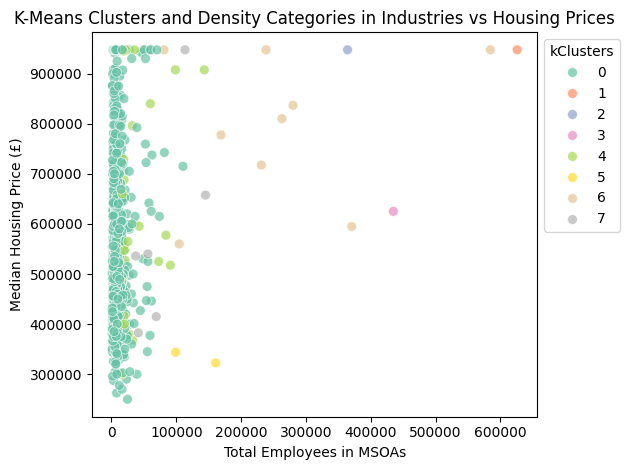

In [127]:
# Scatterplot for clustered data
fig, ax = plt.subplots()

sns.scatterplot(data=pivot_table_IndustryHousing, x='Total_MSOA-Employees', y='Housing Price', hue='kClusters', s=50, palette='Set2', alpha=0.7)

# Set axis labels and title
plt.xlabel('Total Employees in MSOAs')         # X-axis label
plt.ylabel('Median Housing Price (£)')         # Y-axis label
plt.title("K-Means Clusters and Density Categories in Industries vs Housing Prices")  # Title

# Adjust legend position
sns.move_legend(ax, loc='upper left', bbox_to_anchor=(1, 1)) 

# Display the plot
plt.tight_layout()
plt.show()

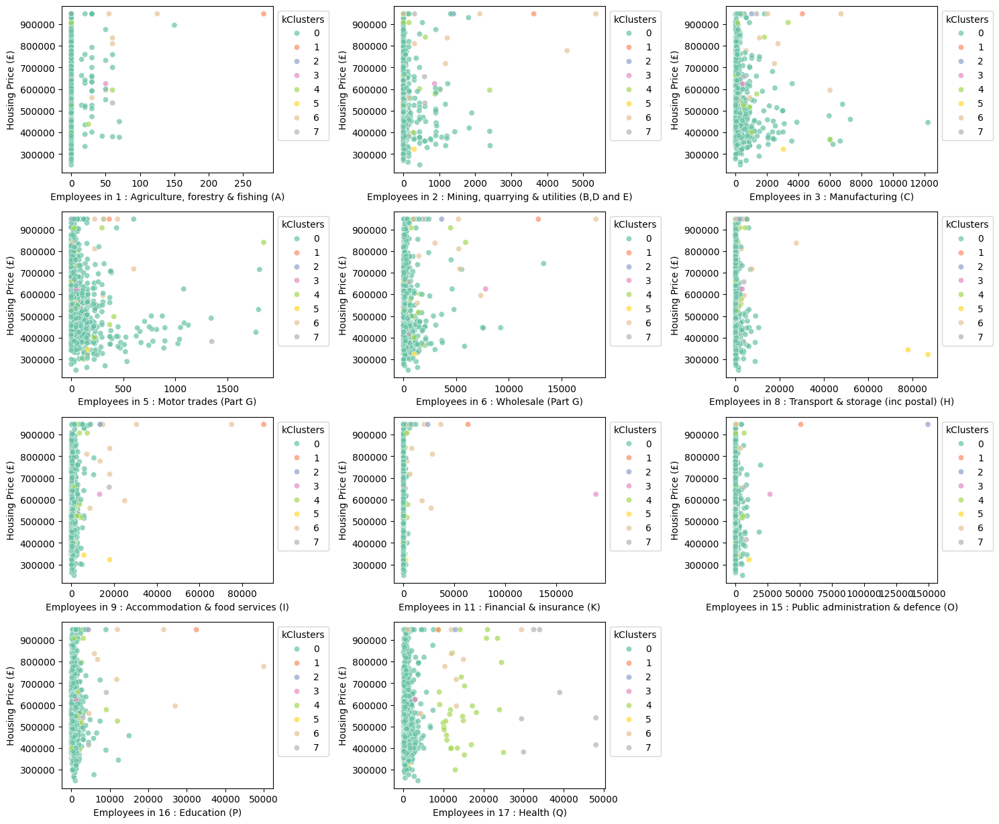

In [128]:
# The scatteplots of Housing Prices vs Number of Employees in different Industries considering K-mean Clusters

plt.figure(figsize=(15, 15))  # Set the figure size

for i, col in enumerate(p_columns2, 1):  # Set Starting enumerate from 1 to prevent subplot errors
    plt.subplot(5, 3, i)  # Create a subplot (5 rows, 3 columns)
    
    # Set details of scatterplot
    sns.scatterplot(data=pivot_table_IndustryHousing, x=col, y='Housing Price', hue='kClusters', palette='Set2', alpha=0.7) 

    plt.xlabel(f"Employees in {col}")  # Set x tiltle
    plt.ylabel("Housing Price (£)")    # Set y tiltle

    plt.legend(title="kClusters", loc='upper left', bbox_to_anchor=(1, 1)) # Set legend location

plt.tight_layout()
plt.show()

The scatter plots above show the observations categorised into 8 clusters, and aims to visualise the potential relationship between the variables of the study, housing prices and employee numbers:
- In the first plot, total employees in each MSOA are compared with housing prices, showing that most areas have low employment counts, while housing prices remain widely spread across clusters. There is no clear trend indicating a strong linear correlation between total employment and housing prices.
- The second series of plots focusing on the employee numbers in each industry, still showed the similar pattern that most industries have high housing prices variation not considering the employment levels.
In both figures, clusters were overlapping, suggesting that employment neither in the aggregated number of employees nor in any specific industry alone, does not generate a pattern in housing prices. Therefore they might be other economic or spatial factors that playing key roles in the housing prices in Greater London. 

## Spatial Visualisation and Analysis
Returning to the research questions, while the statistical analysis confirmed a statistically significant difference in housing prices based on employee numbers, it did not reveal a clear linear relationship between these variables. Also, the whole dataset is categorised into 8 clusters by applying K-Mean machine learning technique. No clear linear relation found between the housing prices and the employee numbers due to plotting the points in clusters. Although, there might be spatial patterns or relations which can contribute in answering the research questions.
 To gain deeper insights, the following spatial plots and analyses were conducted to explore how employment numbers and housing prices vary across different locations:

#### *Joining Data*
Applying spatial analysis is not feasible without linking the data entities to geographic locations. Considering that the study operates at the MSOA level, the dataset is joined with a second dataset that contains geographic attributes for MSOAs. This process enables geographical visualisation and analysis of the variables of the employment and housing prices in Greater London:

In [129]:
# Check boundaries head to spatial join
MSOA2021_Boundaries.head()

,MSOA21CD,MSOA21NM,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry
0,E02000001,City of London 001,532384,181355,51.5156,-0.093490,6f607c15-73bc-4202-91e1-83db0038436c,"POLYGON ((532946.065 181894.827, 533410.692 18..."
1,E02000002,Barking and Dagenham 001,548267,189685,51.5865,0.138756,dd636327-92e3-470d-8b47-b01b13950b20,"POLYGON ((549000.726 190873.464, 549120.966 18..."
2,E02000003,Barking and Dagenham 002,548259,188520,51.5761,0.138149,19953fc5-2bce-45e7-bbb4-d0a2bd0031de,"POLYGON ((548954.517 189063.241, 549085.611 18..."
3,E02000004,Barking and Dagenham 003,551004,186412,51.5564,0.176828,a9a4f239-ef1e-4d78-9d51-5b66d543dd71,"POLYGON ((551943.781 186027.614, 551670.827 18..."
4,E02000005,Barking and Dagenham 004,548733,186824,51.5607,0.144267,76513d10-2baf-43f0-86dd-c1572f17b587,"POLYGON ((549418.68 187442.412, 548983.438 186..."


In [130]:
# Check the pivot table head to spatial join
pivot_table_IndustryHousing.head()

,"1 : Agriculture, forestry & fishing (A)",11 : Financial & insurance (K),15 : Public administration & defence (O),16 : Education (P),17 : Health (Q),"2 : Mining, quarrying & utilities (B,D and E)",3 : Manufacturing (C),5 : Motor trades (Part G),6 : Wholesale (Part G),8 : Transport & storage (inc postal) (H),9 : Accommodation & food services (I),Housing Price,Total_MSOA-Employees,kClusters
MSOA code,,,,,,,,,,,,,,
E02000002,0,0,0,55,450,10,60,65,120,135,750,387500.0,2955,0
E02000003,0,70,0,925,1325,60,465,380,1050,230,1175,432500.0,10970,0
E02000004,0,0,0,1800,225,50,0,15,0,60,190,430000.0,3730,0
E02000005,0,20,0,1500,160,0,45,85,150,105,365,385000.0,3930,0
E02000007,0,0,500,1375,750,450,45,0,45,225,295,370000.0,7775,0


In [131]:
# Join two data frames by inner join, to only keep the common MSOAs in both
Geo_Housing_Employee = MSOA2021_Boundaries.join(pivot_table_IndustryHousing, on='MSOA21CD', how='inner')


In [132]:
# Check the new dataframe info
Geo_Housing_Employee.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 962 entries, 1 to 6673
Data columns (total 22 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   MSOA21CD                                       962 non-null    object  
 1   MSOA21NM                                       962 non-null    object  
 2   BNG_E                                          962 non-null    int64   
 3   BNG_N                                          962 non-null    int64   
 4   LAT                                            962 non-null    float64 
 5   LONG                                           962 non-null    float64 
 6   GlobalID                                       962 non-null    object  
 7   geometry                                       962 non-null    geometry
 8   1 : Agriculture, forestry & fishing (A)        962 non-null    Int64   
 9   11 : Financial & insurance (K)         

In [133]:
#check the crs aligns with British National Grid
Geo_Housing_Employee.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

#### *Spatial Visualisation*
Spatially visualising variables helps in gaining geographical insights into the dataset; Mapping the data, reveals regional variations and allowing for a better understanding of how employment and housing prices are distributed across different MSOAs:

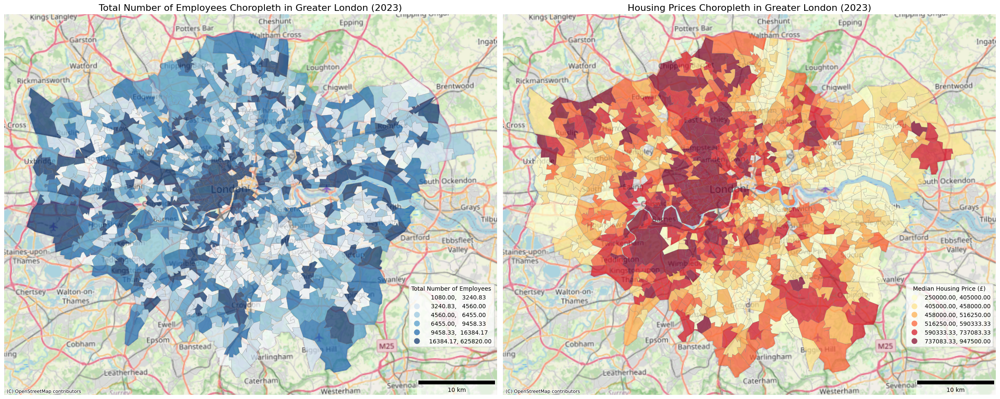

In [134]:
# Creat Choropleths to visualise housing price and employee numbers in each MSOA
fig, axes = plt.subplots(1, 2, figsize=(24, 16))  # Create a figure with two plots in one row, set plot size

# Plot 1: Number of Employees Choropleth
# Set data, scheme and number of categories, aldo set graphic details of colour palette, boundaries, transparency, etc.
Geo_Housing_Employee.plot(ax=axes[0], column='Total_MSOA-Employees', scheme='quantiles', k=6, cmap='Blues', alpha=0.7,
                           edgecolor='grey', linewidth=0.3, legend=True) 

axes[0].set_title('Total Number of Employees Choropleth in Greater London (2023)', fontsize=16) # Set title

# Set legend
leg2 = axes[0].get_legend()
leg2.set_title('Total Number of Employees')
leg2.set_bbox_to_anchor((1, 0.3))

# Add scale bar
scale1 = ScaleBar(dx=1, location='lower right', box_alpha=0.6)
axes[0].add_artist(scale1)

# Add basemap
cx.add_basemap(axes[0], crs='EPSG:27700', source=cx.providers.OpenStreetMap.Mapnik)
axes[0].set_axis_off()


# Plot 2: Housing Prices Choropleth
# Set data, scheme and number of categories, aldo set graphic details of colour palette, boundaries, transparency, etc.
Geo_Housing_Employee.plot(ax=axes[1], column='Housing Price', scheme='quantiles', k=6, cmap='YlOrRd', alpha=0.7,
                           edgecolor='grey', linewidth=0.3, legend=True) 

axes[1].set_title('Housing Prices Choropleth in Greater London (2023)', fontsize=16) # Set title

# Set legend
leg1 = axes[1].get_legend()
leg1.set_title('Median Housing Price (£)')
leg1.set_bbox_to_anchor((1, 0.3))

# Add scale bar
scale2 = ScaleBar(dx=1, location='lower right', box_alpha=0.6)
axes[1].add_artist(scale2)

# Add basemap
cx.add_basemap(axes[1], crs='EPSG:27700', source=cx.providers.OpenStreetMap.Mapnik)
axes[1].set_axis_off()

plt.tight_layout()
plt.show()


The two choropleth maps visualise the spatial distribution of total employees per MSOA (left) and median housing prices (£) (right) in 2023 across the Greater London Authority:

The left uses the blue shades to represent the number of employees in each MSOA. As expected, Central London and surrounding areas, such as Camden, have the highest concentration of employees due to their role as commercial and financial hubs. While the general trend shows a decline in employee concentration toward the periphery, some outer areas still exhibit high employment levels. These include Harrow, Uxbridge, and Kingston upon Thames in west, Croydon in the south, Enfield in the north, etc., These locations serve as key employment centres outside the central business district.

The right map displays housing prices using a yellow-to-red color map, where darker red areas indicate higher housing prices. Higher prices are particularly noticeable in the central and west London, including areas like Hampstead and Chiswick. Some northwestern areas, such as Chipping Barnet, and southwestern areas, like Wimbledon, also show relatively high housing prices, standing out from the general trend of lower costs in peripheral regions.

Comparing the two maps highlights that, although employment density and housing prices do not always align, several high-employment areas in Central London also exhibit high housing prices. Peripheral areas generally have both lower employment and lower housing costs, yet some exceptions exist.

#### *Neighbourhood Analysis of variables*
Considering the spatial relationships between different entities makes spatial analysis more accurate and closer to real-world patterns. In this study, Queen weights are used to define spatial relationships between MSOAs in Greater London. This method considers spatial adjacency, meaning an area is connected to all others that share either a border or a corner, unlike Rook weights, which only considers direct edge-sharing neighbors.
Queen weights were preferred because, in cities, borders and corners do not always create strict separations—any connection can facilitate pedestrian or transport interactions. Another option was to use K-nearest neighbors or MSOAs within a specific distance, but these methods require defining parameters such as distance thresholds or the number of neighbors (K) and rely on polygon centroids rather than entire MSOA boundaries. Given these limitations, Queen neighbors is still the preferred choice for current analysis:

In [135]:
%matplotlib inline
from pysal.lib import weights
from pysal.lib import io
import libpysal
from libpysal import weights
from splot.libpysal import plot_spatial_weights
from pysal.explore import esda
from pysal.viz import splot
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation
import matplotlib.patches as mpatches

/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/spaghetti/network.py:40: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)
/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [136]:
# Calculate Queen Neighbours by Pysal 
w_queen = weights.Queen.from_dataframe(Geo_Housing_Employee, ids = 'MSOA21CD') #based on MSOA code (id)

In [137]:
# Calculate Moran's _I_ value by queen weights
mi_housing_prices = esda.Moran(Geo_Housing_Employee['Housing Price'], w_queen) # Housing prices

print(mi_housing_prices.I.round(3)) # Print the I value, rounded 3 decimals

print(mi_housing_prices.p_sim.round(3)) # Print the p values rounded 3 decimals

0.61
0.001


The Moran’s I Value is calculated to assess the spatial autocorrelation of the median housing prices across MSOAs in Greater London by using Queen weights:

Since Moran’s I theoretically ranges from -1 (perfect dispersion) to +1 (perfect clustering), a value of 0.61 indicates quite positive spatial autocorrelation. This means that areas with higher housing prices tend to be clustered near other high-priced areas, and areas with lower housing prices are also spatially grouped together.  

The p-value of 0.001 confirms that this clustering is statistically significant, meaning the observed pattern is unlikely to have occurred by random chance.  

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.61)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

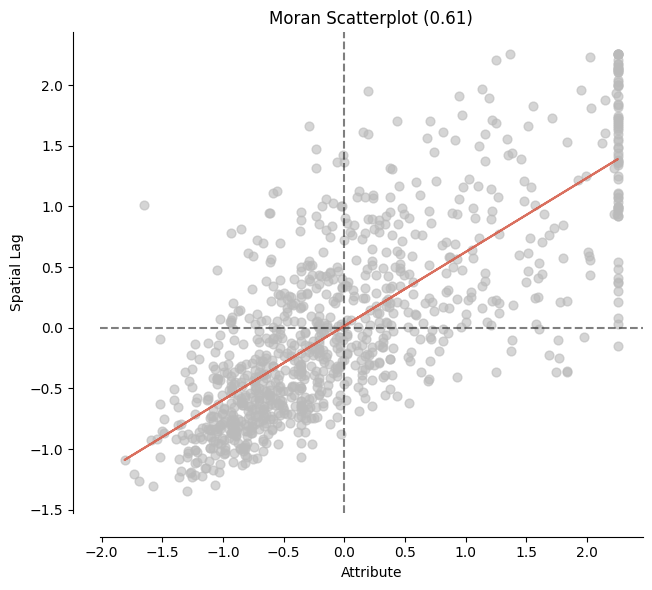

In [138]:
moran_scatterplot(mi_housing_prices) #create the scatterplot

The Moran scatterplot visualises the relationship between housing prices at the MSOA level and their spatial lag (neighboring MSOAs) in Greater London. The positive slope of the red regression line confirms a positive spatial correlation of the mentioned variables in the graph; indicating that areas with high housing prices tend to be surrounded by other high-price areas, and vice versa for low-price areas.

The four quadrants formed by the dashed lines at (0,0) in every Moran scatterplot represent different spatial relationships between the studied variable, which here is housing prices, and its surrounding areas:
- Upper right (HH): High-value areas surrounded by other high-value areas.
- Lower left (LL): Low-value areas surrounded by other low-value areas.
- Upper left (LH): High-value areas surrounded by low-value areas.
- Lower right (HL): Low-value areas surrounded by high-value areas.

As seen in the graph, most points align with the HH and LL quadrants, indicating a moderate to strong clustering pattern, which aligns with the calculated Moran's I value of 0.61. However, the presence of LH and HL points and outliers in the form of a vertical cluster on the extreme right side of the graph, suggest despite of the general trend in Greter london, not every housing pricces follow the overall spatial trend around. This can be due to the impact of the localised factors which are beyond the scope of this study.

Before moving forward to visualising the LISA clusters for the housing prices in Greater London, I would like to have a look at the Moran's I value and the scatterplt for the total number of employees, too:

In [139]:
# Calculate Moran's _I_ value by queen weights
mi_total_employees = esda.Moran(Geo_Housing_Employee['Total_MSOA-Employees'], w_queen) # Total number of employees in MSOA

print(mi_total_employees.I.round(3)) # Print the I value, rounded 3 decimals

print(mi_total_employees.p_sim.round(3)) # Print the p value, rounded 3 decimals

0.52
0.001


The Moran’s I Value is calculated to assess the spatial correlation of total employees per MSOA by using queen weights:

According to the theoretical ranges of the Moran’s I value mentioned above, the value of 0.52 suggests a moderate spatial clustering for the total number of employees per MSOA across Greater London. Therefore, while areas with a high number of employees tend to be near other high-employment areas, the clustering is not particularly strong. like that, areas with lower employment show some degree of spatial grouping, but the pattern is far from perfect.

The p-value of 0.001 indicates that the spatial pattern is statistically significant, so the observed clustering is unlikely to have occurred by random chance.

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.52)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

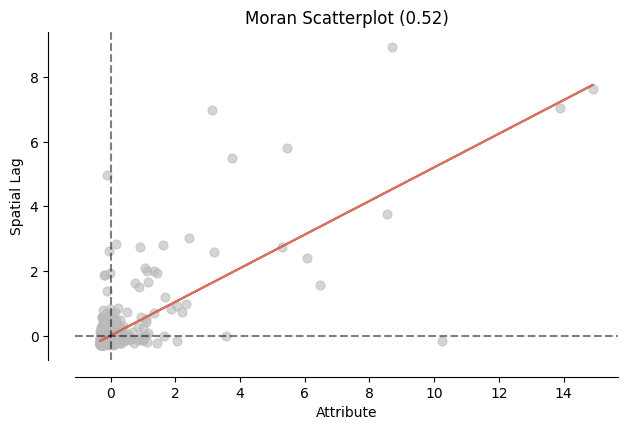

In [140]:
moran_scatterplot(mi_total_employees) #create the scatterplot

The above graph visualises the relationship between the spatial clustering of the total number of employees per MSOA in Greater London. It plots the attribute (employee numbers in each MSOA) against its spatial lag, which represents the Queens weighed average of employee numbers in neighboring MSOAs. The red regression line shows a positive spatial correlation, confirming that areas with higher concentrations of employees tend to be surrounded by other high-employment areas. However, since the Moran's I value (0.52) is moderate and not close to 1, the clustering is not quite strong.

Focusing on the graph, the points in the upper right quadrant (HH) represent MSOAs with high employment density, surrounded by other high-employment areas. However, these points are less concentrated than in other quadrants, and their values vary more widely. This may indicate diverse employment hubs in the matter of employees size, such as central business districts or different financial centers. The points in the lower left quadrant (LL) represent MSOAs with low employment density, surrounded by other low-employment areas. These likely correspond to predominantly residential zones or local services supporting them.

The upper left quadrant (LH) includes MSOAs with high employment but surrounded by low-employment areas. These may be isolated employment hubs, such as business parks, industrial zones, etc., located within residential regions. The lower right quadrant (HL) represents the opposite pattern—MSOAs with low employment but surrounded by high-employment areas. These could include natural sites or within the Greater London such as parks, or either residential blocks or large infrastructure sites that do not host significant employees but are close to commercial or employment-dense areas.

Below, the LISA Cluster Maps for housing prices and total number of employees per MSOA are plotted for Greater London (2023). These maps illustrate spatial clusters for both variables, identifying areas with statistically significant high-high (HH) and low-low (LL) clusters, as well as high-low (HL) and low-high (LH) spatial outliers:

In [141]:
# Calculate LISA clusters for Housing Price
lisa_hp = esda.Moran_Local(Geo_Housing_Employee['Housing Price'], w_queen)
Geo_Housing_Employee['Sig_Housing'] = lisa_hp.p_sim < 0.05  # Significant at 95% level
Geo_Housing_Employee['Quad_Housing'] = lisa_hp.q  # Cluster category

# Calculate LISA clusters for Total Employees
lisa_emp = esda.Moran_Local(Geo_Housing_Employee['Total_MSOA-Employees'], w_queen)
Geo_Housing_Employee['Sig_Employees'] = lisa_emp.p_sim < 0.05  # Significant at 95% level
Geo_Housing_Employee['Quad_Employees'] = lisa_emp.q  # Cluster category

/var/folders/wd/1wf586s93vg1fbnl295w_w1r0000gn/T/ipykernel_74498/4223608401.py:18: UserWarning: The GeoSeries you are attempting to plot is empty. Nothing has been displayed.
  hl.plot(ax=ax, color = 'LightCoral', alpha = 0.7)


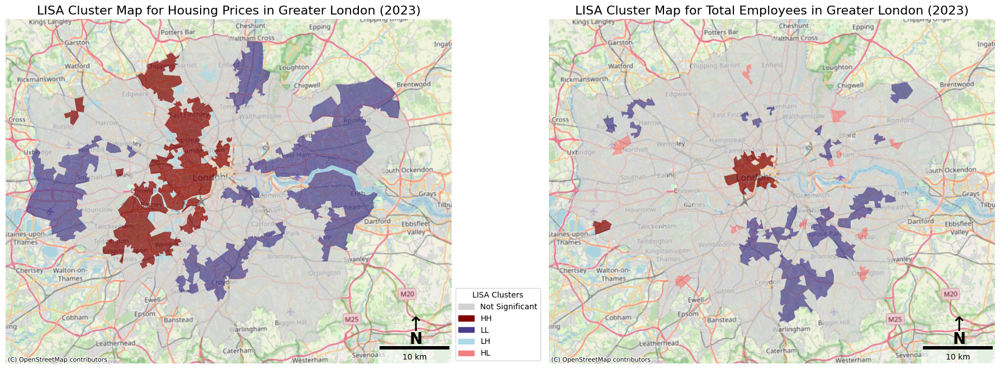

In [142]:
# LISA Cluster Map
fig, axes = plt.subplots(1, 2, figsize=(18, 8))  # Create figure with two subplots

# Housing Prices
ax = axes[0]  # Left subplot

# Define quadrants labels based on the values from 1 to 4 and statistical significance
hh = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Housing']==1) & (Geo_Housing_Employee['Sig_Housing']== True), 'geometry']
ll = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Housing']==3) & (Geo_Housing_Employee['Sig_Housing'] == True), 'geometry']
lh = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Housing']==2) & (Geo_Housing_Employee['Sig_Housing'] == True), 'geometry']
hl = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Housing']==4) & (Geo_Housing_Employee['Sig_Housing'] == True), 'geometry']
ns = Geo_Housing_Employee.loc[Geo_Housing_Employee['Sig_Housing'] == False, 'geometry']

# Plot the quads and set the details of colours and transparency
hh.plot(ax=ax, color = 'Maroon', alpha = 0.7)
ll.plot(ax=ax, color = 'DarkSlateBlue', alpha = 0.7)
lh.plot(ax=ax, color = 'LightBlue', alpha = 0.7)
hl.plot(ax=ax, color = 'LightCoral', alpha = 0.7)
ns.plot(ax=ax, color = 'lightGrey', alpha = 0.7)

ax.set_title('LISA Cluster Map for Housing Prices in Greater London (2023)', fontsize=16) # Set plot title and font size
ax.set_axis_off() # Remove axis 

cx.add_basemap(ax, crs='EPSG:27700', source=cx.providers.OpenStreetMap.Mapnik) # Add base map

# Add symbols indicating for North, set the location, and font details
ax.annotate('N', xy=(0.92, 0.07), xycoords='axes fraction', fontsize=20, ha='center', va='center', fontweight='bold') 
ax.annotate('↑', xy=(0.92, 0.11), xycoords='axes fraction', fontsize=26, ha='center', va='center')

# Add scale bar and set transparency
scale1 = ScaleBar(dx=1, location='lower right', box_alpha=0.6)
ax.add_artist(scale1)

# Add legend
hh_lab = mpatches.Patch(color='Maroon', label='HH')
ll_lab = mpatches.Patch(color='DarkSlateBlue', label='LL')
lh_lab = mpatches.Patch(color='LightBlue', label='LH')
hl_lab = mpatches.Patch(color='LightCoral', label='HL')
ns_lab = mpatches.Patch(color='lightGrey', label='Not Significant')

# Plot the legend
leg = ax.legend(handles=[ns_lab, hh_lab, ll_lab, lh_lab, hl_lab], title="LISA Clusters", loc='upper left', bbox_to_anchor=(1, 0.23))


# Total Number of Employees
ax = axes[1]  # Right subplot

# Define quadrants labels based on the values from 1 to 4 and statistical significance
hh = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Employees']==1) & (Geo_Housing_Employee['Sig_Employees']== True), 'geometry']
ll = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Employees']==3) & (Geo_Housing_Employee['Sig_Employees'] == True), 'geometry']
lh = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Employees']==2) & (Geo_Housing_Employee['Sig_Employees'] == True), 'geometry']
hl = Geo_Housing_Employee.loc[(Geo_Housing_Employee['Quad_Employees']==4) & (Geo_Housing_Employee['Sig_Employees'] == True), 'geometry']
ns = Geo_Housing_Employee.loc[Geo_Housing_Employee['Sig_Employees'] == False, 'geometry']

# Plot the quads and set the details of colours and transparency
hh.plot(ax=ax, color = 'Maroon', alpha = 0.7)
ll.plot(ax=ax, color = 'DarkSlateBlue', alpha = 0.7)
lh.plot(ax=ax, color = 'LightBlue', alpha = 0.7)
hl.plot(ax=ax, color = 'LightCoral', alpha = 0.7)
ns.plot(ax=ax, color = 'lightGrey', alpha = 0.7)

ax.set_title('LISA Cluster Map for Total Employees in Greater London (2023)', fontsize=16) # Set plot title and font size
ax.set_axis_off() # Remove axis 

cx.add_basemap(ax, crs='EPSG:27700', source=cx.providers.OpenStreetMap.Mapnik)  # Add base map

# Add symbols indicating for North, set the location, and font details
ax.annotate('N', xy=(0.92, 0.07), xycoords='axes fraction', fontsize=20, ha='center', va='center', fontweight='bold')
ax.annotate('↑', xy=(0.92, 0.11), xycoords='axes fraction', fontsize=26, ha='center', va='center')

# Add scale bar and set transparency
scale2 = ScaleBar(dx=1, location='lower right', box_alpha=0.6)
ax.add_artist(scale2)

plt.tight_layout()
plt.show()

The LISA Cluster Maps above illustrate the spatial clustering of the housing prices and the total employees per MSOA in Greater London, based on the spatial lag and the statisticully significance of the variables:  

Focusing on the Housing prices (left map) indicates that:
- The **HH clusters** coloured in maroon, are concentrated in the central London and places like Camden Town, Hampstead,  etc., and extended southwest toward Kingston upon and Wimbledon, and northwest toward Chipping Barnet. Also, there are some dispersed spots in the west and northwest, such as Ruislip and Ealing, where higher-priced MSOAs cluster with other higher-priced MSOAs. These areas might be known for their high property values, based on the analysis results.  
- The **LL clusters** coloured in dark blue, form quite large regions in the middle and outer rings, such as areas around Heathrow Airport (west), lands between Tottenham and Waltham Cross (north), and Bexleyheath and East Ham (east). These spots indicate relatively lower housing prices in Greater London.  
- The **LH clusters** and **HL clusters**, representing price contrasts between neighboring areas, hardly can be found in the map, reinforcing the overall spatial dependence of housing prices in Greater London.  

Focusing on the Total employees numbers (right map) indicates that:  
- The **HH clusters**, are mainly concentrated in the City of London and a western spot near Heathrow Airport. These areas might be serving as key business and financial hubs.  
- The **LL clusters**, are mostly distributed in outer residential boroughs such as Havering, Croydon, and Bromley, in addition to some smaller regions in the north.  
- The **HL clusters**, appear near Northolt in the west and somewhere between Chipping Barnet and Enfield in the north. Also, some tiny regions in the central east exhibit this pattern. These might be places where major employment hubs are located within lower business density regions, possibly residential or local service areas.  

The gray-coloured regions in both maps show places where there is no statistically and spatially significant correlation.

Comparing the two maps above shows that:  
- There is stronger spatial clustering in housing prices rather than in employee numbers in Greater London. Property values appear to be more influenced by local and neighborhood effects (as supported by the housing Moran’s I p-value and significance).  
- While some clustering is evident in employee numbers, economic activity in the Greater London seems to be more dispersed and driven by factors beyond local spatial dependencies.  
- Aligning the same clusters in both maps (e.g., higher housing price clusters with higher employee number clusters) does not always hold true. While this happens in the City of London and some areas in the west and east, many high housing prices do not align with the employment hubs. **This suggests that proximity to economic and business centers does not always play a critical role in determining housing prices.**

#### **Geographically Weighted Regression**
Despite finding no clear linear correlation between housing prices and local employee numbers in Greater London, a significant difference in housing prices was observed during visual analaysis. Therefore, Geographically Weighted Regression (GWR) model is applied to help examining whether local factors influence how the variables interact across different areas in Greater London:

In [143]:
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW

In [144]:
# Set GWR parameters to calculate bandwidth
g_coords = list(zip(Geo_Housing_Employee.LONG, Geo_Housing_Employee.LAT)) # Create a list of x and y coordinates, using the longitude and latitude
g_y = np.asarray(Geo_Housing_Employee['Housing Price']).reshape((-1,1)) # Set Y variable
g_X = np.asarray(Geo_Housing_Employee['Total_MSOA-Employees']).reshape((-1,1)) # Set X variable
gwr_selector = Sel_BW(g_coords, g_y, g_X, fixed = True, spherical = True) # Set parameters for calculating the bandwidth

In [145]:
# Find the appropriate bandwidth for GWR
bw = gwr_selector.search()
print(bw)

/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/naiemegolzari/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently t

3.94


In [146]:
# Set the GWR parameters
gwr = GWR(g_coords, g_y, g_X, bw)

In [147]:
# Fit the GWR
gwr_results = gwr.fit()

In [148]:
# GWR Summary
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 962
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       27376033771031.469
Log-likelihood:                                                  -12943.494
AIC:                                                              25890.989
AICc:                                                             25893.014
BIC:                                                           27376033764437.215
R2:                                                                   0.034
Adj. R2:                                                              0.033

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- -----

As mentioned above, the GWR model is used to analyse the relationship between housing prices and local employee numbers in Greater London. In the process of applying GWR, for some reasons and despite non-normal distribution of data, the Gaussian model is used here which might not be the best choice. Also to understand the location effects on the studied variables relationship, the output reports starts with comparing GWR results and global regression model, or Ordinary Least Square regression called during the labs:

Considering the value of R2 (0.034) in the global regression model, and comparing to it's theoretical ranges of 0 to 1, shows a very weak linear relationship between employment numbers and the housing prices in the data frame. Therefore, only 3.4% of the variation in housing prices of MSOAs can be explained by employment numbers in the same MSOA. The coefficient for employee numbers (X1 = 0.770) suggests that by adding only one more job in any MSOA in the Greater London, the median of housing prices in the same MSOA is expected to be increased 0.770 unit. And this correlation is statistically significant (p-value ≤ 0.05). Additionally, the intercept (X0 = 549261.564, p ≤ 0.05) shows that even in any MSOA with no employees, the predicted median housing price would still be 549,261.564 units. This may represents the influence of other factors not included in the model. However, since the R2 value is very low (0.034), hardly more than 3% of explanations may be expected to be aligned. This reinforces the visual findings from the scatterplots and showing that a global model may not effectively capture the complexity of this relationshipp.

Considering the GWR results, the R2 value of 1 which is the highest possible, seems strangely idealistic, suggesting that the chosen bandwidth value might be too small and causing the model to use only a few nearby data points for each calculation and making it behave as if it is fitting a regression line to very limited observations. This reminds an scatterplot with only a few points, where the model easily generates a perfect line. This localisation, maybe due to my fault in applying bandwidth or maybe a kind of expectable error, seems kind of paradoxical with the concept of regression and a kind of failure in explaining the overall pattern. Since this part is not the main focus of directly answering the first question, I decided to increase the bandwidth to 39.4 (10X) to see how it would affect the results, even though this doesn't follow the lab's instructions, but may cover the possible risk of erros:

In [149]:
# Set a mannual number for bandwidth
bw= 39.4

# Set the GWR parameters
gwr = GWR(g_coords, g_y, g_X, bw)

# Fit the GWR
gwr_results = gwr.fit()

# GWR Summary
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 962
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       27376033771031.469
Log-likelihood:                                                  -12943.494
AIC:                                                              25890.989
AICc:                                                             25893.014
BIC:                                                           27376033764437.215
R2:                                                                   0.034
Adj. R2:                                                              0.033

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- -----

By increasing the bandwidth to 39.4, Geographically Weighted Regression is applied in wider local ranges compared to the previous bandwidth. And as it was expected the R2 value decreased to a lower value, from 1 to 0.656. This means that the model is still functional in explaining the overall trends of the data while covering 65.6% of the variation in housing prices. Eventhough, I was unsuccessful in the challenge of finding the most appropriate bandwidth. Also comparing the GWR parameters above shows that:  

The coefficients (X1) and the intercept (X0) values vary significantly across locations. These variations respectively indicate employment’s impact on housing prices and also the unaccounted factors on housing prices variations across Greater London.

Despite the limitations mentioned above, the findings help in providing additional insight to answer for the first question that the **local atributes play a key role in the relationship between employee numbers and housing pricesin Greater London.**

Since the goal of the current part of the analysis is to explore spatial relationships rather than developing a predictive model like what is going on to answer the third question, the findings are plotted and explored below:


In [150]:
# Filter the coefficient of the only one predictor variable
Geo_Housing_Employee['GWR_Beta'] = gwr_results.params[:,1] 

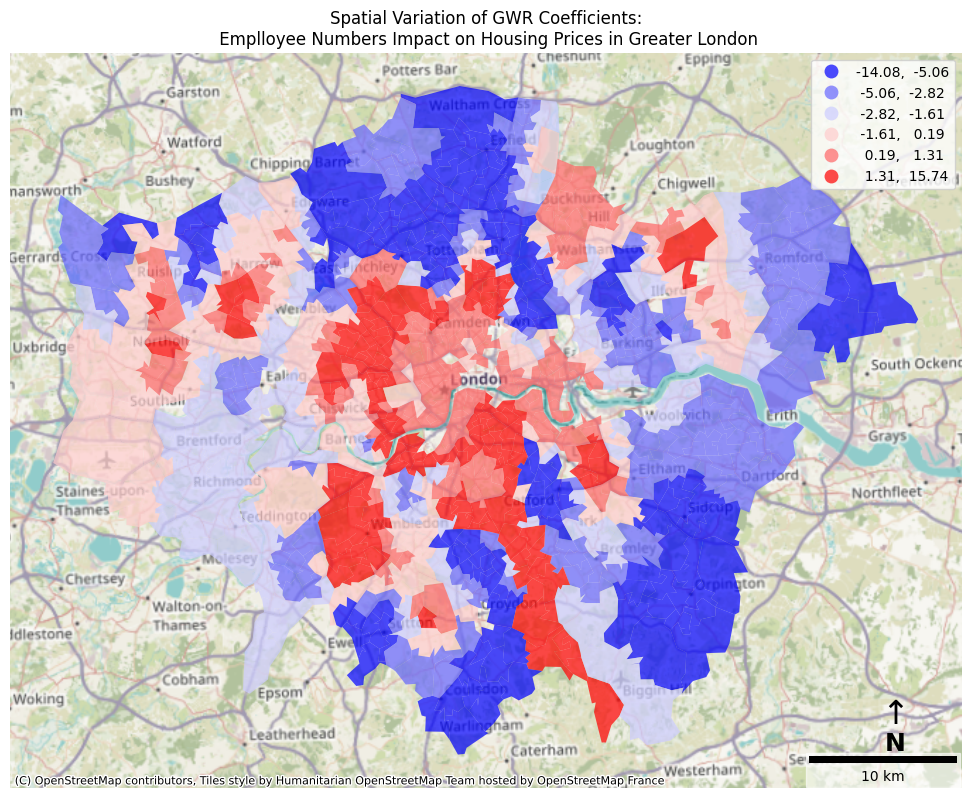

In [151]:
# Plot the coefficient values 
fig, ax = plt.subplots(1, figsize=(10, 8))

Geo_Housing_Employee.plot(ax = ax,column = 'GWR_Beta', cmap = 'bwr',alpha=0.7, scheme = 'quantiles', k = 6,legend = True) # Set details of the dataframe, column, colourmap, transparency, etc

plt.title('Spatial Variation of GWR Coefficients:\n Emplloyee Numbers Impact on Housing Prices in Greater London') #Add a title

leg = ax.get_legend()
leg.set_bbox_to_anchor((1,1)) # Set legend position

ax.set_axis_off() # Remove axis

# Add scalebar
scale1 = ScaleBar(dx=1,location='lower right', box_alpha=0.6)
ax.add_artist(scale1)

# Add North arrow
ax.annotate('N', xy=(0.93, 0.06), xycoords='axes fraction', fontsize=18, ha='center', va='center', fontweight='bold')
ax.annotate('↑', xy=(0.93, 0.10), xycoords='axes fraction', fontsize=24, ha='center', va='center')

# Add the basemap with the CRS of the shapefile data
cx.add_basemap(ax, crs = 'EPSG:27700')

plt.tight_layout()
plt.show()


The map above visualises the spatial variation of GWR (Geographically Weighted Regression) coefficients, and the effect of the total employee numbers in any MSOA and its neighbours, on the median housing prices there, across Greater London:

Areas shaded in red indicate a positive relationship between employment levels and housing prices, meaning that increased employment is associated with higher housing prices. This pattern is visible in Central London, as well as in parts of Calford, Croydon, and Wimbledon in the south, along with smaller areas in Northolt (west) and Ilford with its surrounding neighborhoods in the northeast. A few possible explanations can be considered, all focusing on increasing the housing demands by increaing the job ooprtunities in the mentioned regions. In Central London, the high demand for housing in job-dense areas is the most likely reason for this trend. However, in outer regions, red-shaded areas may represent local economic centers within Greater London, where higher land demand for residential purposes exists to reduce daily commute times by living closer to job opportunities. Alternatively, an opposite interpretation is also possible—these areas may have fewer local services or job opportunities, meaning that any increase in employment could improve local living conditions, subsequently driving up housing demand.

In contrast, blue areas represent a negative relationship, suggesting that higher employment numbers contributes in lower housing prices. Outer London and peripheral areas in north like Enfield, Tottenham, and Eagware, also Romford and Orpington in east, Warlingham and Ewell in south, also some smaller regions in northwest are shaded in blue. At this stage, I cannot fully explore the potential reasons for this pattern due to limited knowledge about the specific areas. However, an early assumption might be that these peripheral locations reflect suburban living preferences, where residents may prefer keeping distance from the hectic lifestyle in the centers. In this case, an increase in local employment opportunities may lowers the local preferencies and decrease the residential demands and willingness to pay. Although, all of the assumptions need being supported by further research studies.

Lighter shades in the map show regions where changes employment does not apply neither a great amount of positive or negative impact on the housing prices in Greater London, although there is a correlation the amount is not huge compared to other parts of the studied area, maybe indicating some balance in the housing market based on the employee numbers working in the regions. 

Overall, the map highlights the role of a local economic factor, total number of employees working in an MSOA and neighbouring, in shaping the variation in housing markets across Greater London. However, it remains essential to determine whether these findings are statistically reliable. To address this, a visual assessment of the Q-Q plot of residuals is done to quickly evaluate the model's functionality:

In [152]:
# Add the residuals to the data frame
Geo_Housing_Employee['GWR_res'] = gwr_results.resid_response

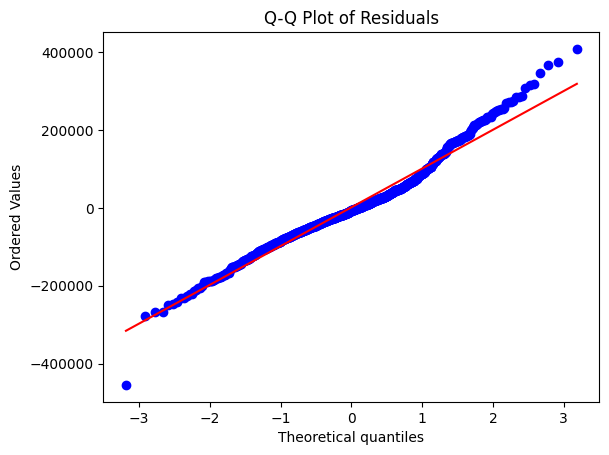

In [153]:
# Plot Q-Q Plot
plt.figure()
stats.probplot(Geo_Housing_Employee['GWR_res'], dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.show()


The Q-Q plot is used above to visually assess whether the residuals follow a normal distribution. Since most blue points align closely with the red line, the residuals appear reasonably normal, despite some deviations at the tails.

However, the primary focus at this stage is not evaluating the model’s predictive accuracy for housing prices. As a result, neither a normality test nor a LISA Cluster Map for residuals is conducted at this point. These steps, along with further assumption checks for linear regression, will be performed later as part of the analysis for the third research question.

In summary, the Geographically Weighted Regression (GWR) model provided insights in answering the first question and clearing the ambiguity of the linear correlation of the housing prices and the employee numbers in Greater London by adding the spatial variability. While the global model suggested a weak overall correlation, GWR revealed localized effects, showing that in some areas, higher employment levels are associated with increased housing prices, while in others, the impact is weaker or even negative. Therefore, the findings suggest that employment density does play a role in shaping the housing market, though its influence varies across different locations.

#### **Multi-Level model**
To address the third research question—whether housing prices in Greater London can be modeled based on local employment numbers in different industries—a multilevel modeling approach is proposed as an alternative to response, although it was not the only possible model which could be used. In this approach an spatial heterogeneity is assumed between clusters of the dataset rather than assuming a uniform relationship like what happens in OLS. This multilevel model aims to capture hierarchical dependencies—for example, whether the effect of employment varies within and between different spatial clusters.Therefore, and in this framework:

The median housing prices will be analysed within distinct K-Means clusters, which categorises areas with similar market characteristics, allowing for a more localized understanding of housing price variations; The number of employees across different industries will serve as explanatory variables, enabling a more detailed analysis of how employment composition influences housing prices in different parts of Greater London. Additionally, the model will help determine whether certain industries have a stronger impact on housing prices, which could provide insights for urban planning and policy-making.

In case of developing a successful predictive model by integrating both clustering (via K-Means) and industry-specific employment data, a structured framework will be offered for predicting housing prices based on local economic conditions in Greater London:

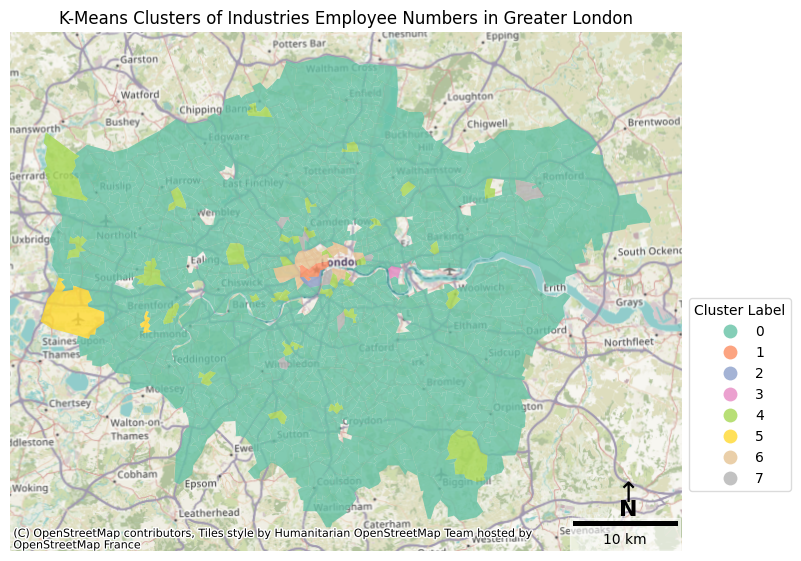

In [154]:
# Visualise the different areas of Leeds with clusters
fig, ax = plt.subplots(figsize=(8,6))  # Adjust figure size
Geo_Housing_Employee.plot(ax=ax, column='kClusters', categorical=True, legend=True, cmap='Set2', alpha=0.8)

# Add title
ax.set_title('K-Means Clusters of Industries Employee Numbers in Greater London', fontsize=12)

# Add legend adjustments
leg = ax.get_legend()
leg.set_title('Cluster Label')  # Set legend title
leg.set_bbox_to_anchor((1, 0.5))  # Adjust legend position
leg.get_frame().set_alpha(0.7)  # Set legend transparency

# Add North arrow
ax.annotate('N', xy=(0.92, 0.08), xycoords='axes fraction', fontsize=16, ha='center', va='center', fontweight='bold')
ax.annotate('↑', xy=(0.92, 0.11), xycoords='axes fraction', fontsize=20, ha='center', va='center')

# Add scale bar
scale1 = ScaleBar(dx=1, location='lower right', box_alpha=0.6)
ax.add_artist(scale1)

# Add the basemap with the CRS of the shapefile data
cx.add_basemap(ax, crs = 'EPSG:27700')

# Remove axis
ax.set_axis_off()

plt.tight_layout()
plt.show()


The above map illustrates the K-Means clustering of employee numbers for different industries across Greater London. The dominant cluster in dark green (labeled 0) covers most of the region, indicating that the majority of areas share similar employment characteristics across different industries. Smaller clusters, such as Clusters 1, 2, 4, and 6 appear concentrated in central London. Also some wider regions od cluster 5 (yellow), 4 (light green) and 7 (gray) are distributed in suburban areas. The dominant size of cluster 0 is expected since larger number of observations were categorised in this cluster. To understand the differences of the clusters in the matter of number of dominant employees, there is a need to plot industry employees in every cluster and compare them which is beyond the questions of current study, so by skipping this part, I will only use the clusters as an input to the MLM model to see if they can contribute in predicting housing prices in Greater London:

In [155]:
import statsmodels.formula.api as smf

In [156]:
p_columns2

['1 : Agriculture, forestry & fishing (A)',
 '2 : Mining, quarrying & utilities (B,D and E)',
 '3 : Manufacturing (C)',
 '5 : Motor trades (Part G)',
 '6 : Wholesale (Part G)',
 '8 : Transport & storage (inc postal) (H)',
 '9 : Accommodation & food services (I)',
 '11 : Financial & insurance (K)',
 '15 : Public administration & defence (O)',
 '16 : Education (P)',
 '17 : Health (Q)']

In [157]:
Geo_Housing_Employee.columns

Index(['MSOA21CD', 'MSOA21NM', 'BNG_E', 'BNG_N', 'LAT', 'LONG', 'GlobalID',
       'geometry', '1 : Agriculture, forestry & fishing (A)',
       '11 : Financial & insurance (K)',
       '15 : Public administration & defence (O)', '16 : Education (P)',
       '17 : Health (Q)', '2 : Mining, quarrying & utilities (B,D and E)',
       '3 : Manufacturing (C)', '5 : Motor trades (Part G)',
       '6 : Wholesale (Part G)', '8 : Transport & storage (inc postal) (H)',
       '9 : Accommodation & food services (I)', 'Housing Price',
       'Total_MSOA-Employees', 'kClusters', 'Sig_Housing', 'Quad_Housing',
       'Sig_Employees', 'Quad_Employees', 'GWR_Beta', 'GWR_res'],
      dtype='object')

In [158]:
# Rename the columns used in the mlm model to avoid error
Geo_Housing_Employee = Geo_Housing_Employee.rename(
    columns={
        'Housing Price': 'Housing_Price',
        '1 : Agriculture, forestry & fishing (A)': 'Agriculture',
        '2 : Mining, quarrying & utilities (B,D and E)': 'Mining_Utilities',
        '3 : Manufacturing (C)': 'Manufacturing',
        '5 : Motor trades (Part G)': 'Motor_Trades',
        '6 : Wholesale (Part G)': 'Wholesale',
        '8 : Transport & storage (inc postal) (H)': 'Transport_Storage',
        '9 : Accommodation & food services (I)': 'Accommodation_Food',
        '11 : Financial & insurance (K)': 'Financial_Insurance',
        '15 : Public administration & defence (O)': 'Public_Admin',
        '16 : Education (P)': 'Education',
        '17 : Health (Q)': 'Health',
        'Total_MSOA-Employees': 'EmployeeSum'
    }
)


In [159]:
 formula = ('Housing_Price ~ Agriculture + Mining_Utilities + Manufacturing + Motor_Trades + Wholesale + Transport_Storage +'
           'Accommodation_Food + Financial_Insurance + Public_Admin + Education + Health')

# Apply mlm model: housing prices based on the number of employees in any indusry in a level and kclusters as the second
mlm_results = smf.mixedlm(formula, Geo_Housing_Employee, groups='kClusters').fit() 

print(mlm_results.summary())

                      Mixed Linear Model Regression Results
Model:                    MixedLM       Dependent Variable:       Housing_Price   
No. Observations:         962           Method:                   REML            
No. Groups:               8             Scale:                    26585028737.7663
Min. group size:          1             Log-Likelihood:           -12874.5759     
Max. group size:          910           Converged:                Yes             
Mean group size:          120.2                                                   
----------------------------------------------------------------------------------
                         Coef.         Std.Err.    z    P>|z|   [0.025    0.975]  
----------------------------------------------------------------------------------
Intercept                 468383.402  197393.223  2.373 0.018 81499.795 855267.009
Agriculture                  997.554     577.988  1.726 0.084  -135.282   2130.391
Mining_Utilities           

The multi-level model used in this analysis aims to investigate the factors influencing housing prices in Greater London. This model considers two levels:

Within the industrial level, the model captures the the unique contribution of number of employees in different economic activities, represented by industries, on housing prices (the fixed effects).

Within the kClusters, the model considers regional variations that cannot be explained by industry-specific factors alone. Clusters represent groupings of areas with similar characteristics, reflecting unique regional patterns and conditions affecting housing prices (the random effects). 

This approach allows the model to simultaneously consider industry-level influences and broader spatial patterns across Greater London caused by clusters. 

The results of the model indicate that housing prices in Greater London are influenced by the distribution of economic activities in the region, as well as by differences between clusters of areas. The clusters reflect groupings of areas with similar characteristics, capturing unique regional effects on housing prices.

The intercept (468,383.402) represents the estimated baseline housing price when all predictor variables (employment numbers in all industries) are set to zero. This scenario reflects a hypothetical condition where there would be no employees in any economic sector in an MSOA. This might capture the influence of all other factors not included in this model, such as local amenities, infrastructure, development costs, and broader market conditions.

**Effects of Employee Numbers in each Industry on Housing Prices in Greater London**

The table below summarizes the effects of number of employees in different industries on housing prices, categorized into significant positive, significant negative, and no significant effects.

|   Industry                       |   Coefficient       |  p-value    |  Effect                     |
|----------------------------------|---------------------|-------------|-----------------------------|
| Agriculture                      | 997.554             | 0.084       | No Significant Effect       |
| Accommodation & Food Service     | 14.544              | 0.000       | Significant Positive        |
| Transport & Storage              | -2.057              | 0.580       | No Significant Effect       |
| Manufacturing                    | -23.402             | 0.004       | Significant Negative        |
| Motor Trades                     | -92.622             | 0.004       | Significant Negative        |
| Mining & Utilities               | -49.359             | 0.015       | Significant Negative        |
| Wholesale                        | 6.108               | 0.464       | No Significant Effect       |
| Education                        | 2.803               | 0.398       | No Significant Effect       |
| Health                           | 3.916               | 0.233       | No Significant Effect       |
| Public Administration            | -2.399              | 0.422       | No Significant Effect       |
| Financial & Insurance            | -0.540              | 0.828       | No Significant Effect       |
  


The results form the mlm model, also helps answering the **Question Number 2**:

- Positive influences on housing prices were observed in the Accommodation & Food Service industry, suggesting that this sector contributes to higher property values in the area. The coefficient for Accommodation & Food Service (14.544) means that adding one additional employee in this industry increases the median housing price by approximately £14.54, assuming all other factors remain constant.
- In contrast, the number of employees in Manufacturing, Motor Trades, and Mining & Utilities are associated with significant negative effects on housing prices. For example, the coefficient for Motor Trades (-92.622) suggests that an increase of one employee in this sector decreases median housing prices by approximately £92.62.
- Changes in the number of employees in other industries, such as Agriculture, Education, Public Administration, and Health, do not significantly affect median housing prices in Greater London.


**Random of Effects of Clustering on Housing Prices in Greater London:**

The variation in housing prices caused by differences between clusters (kClusters) is extremely large, with a variance estimate of 185049119540.646 This means that the unique characteristics of each cluster play an important role in explaining housing price.

#### Testing the Assumptions of the Linear Regression Model

The validity of a linear model, whether in its classical form or further extensions such as grounded or multilevel linear regression, relies on several assumptions. These assumptions are adapted from the framework of the classical linear regression model (Poole and O’Farrell, 1971) and have been applied in the context of this mini-project, considering the assumptions concept and the technical examinations and modifications available:

1. **Linearity**  
   The relationship between the dependent variable (housing prices) and the independent variables (industry-specific employment) is assumed to be linear in the parameters of MLM model:  
      During the visualisation and statictical assessments above, not a strong significant linear correlation between variables found. (R2=0.34)

2. **No Multicollinearity**  
   Multicollinearity occurs when independent variables are highly correlated, violating the assumption of linear independence. 
    Multicollinear explanatory variables were identified and removed before building the multi variable models by examining the correlation matrix and looking for highly correlations between predictors. This ensured that the remaining variables were not excessively correlated.

3. **Homoscedasticity**  
   Homoscedasticity requires that the variance of residuals remains constant across predictors. In other words, residuals should randomly scattered, with no systematic clustering:  
      Residuals vs. fitted values plots are generated to detect any patterns suggesting heteroscedasticity. Uniform scatter around the zero line would confirm homoscedasticity.


In [160]:
# Add the multi-level model residuals to the data frame
Geo_Housing_Employee['mlm_res'] = mlm_results.resid

In [161]:
# Predicted values from the mixed linear model
y_pred_mlm = mlm_results.fittedvalues

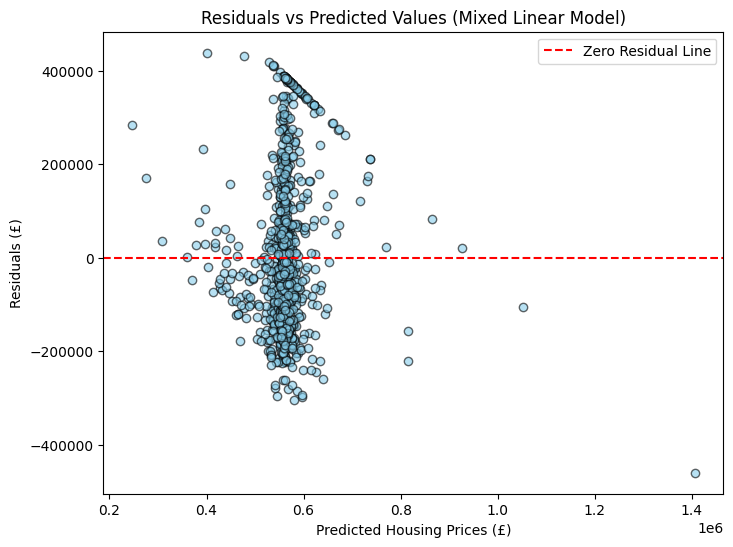

In [162]:
# Residuals vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_mlm, Geo_Housing_Employee['mlm_res'], alpha=0.6, color='skyblue', edgecolor='black')
plt.axhline(0, color='red', linestyle='--', label='Zero Residual Line')
plt.title('Residuals vs Predicted Values (Mixed Linear Model)')
plt.xlabel('Predicted Housing Prices (£)')
plt.ylabel('Residuals (£)')
plt.legend()
plt.show()

Considering the above plot shows that the model assumption about homoscedasticity id violated. Since ideally, the residuals should be randomly scattered around zero, with no clear pattern. While the spread of residuals from this model is farm from how it should be, also created a vertical cluster, violationg the heteroscedasticity assumption.

4. **Normality of Residuals**  
   The assumption of normality of residuals looks for residuals following a normal distribution.
      The normality of residuals in different models are evaluated by using drawing Q-Q Plot.

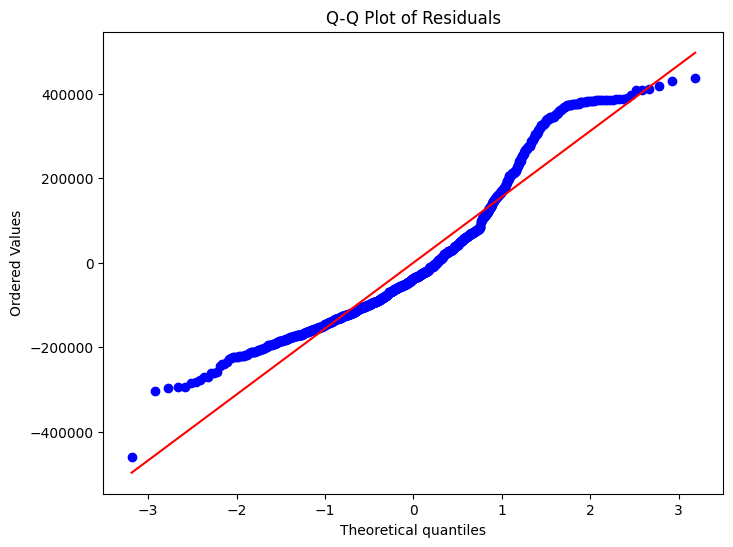

In [163]:
# Plot Q-Q Plot
plt.figure(figsize=(8, 6))
stats.probplot(Geo_Housing_Employee['mlm_res'], dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.show()

The Q-Q plot of residuals indicates that the normality assumption is violated, too. If the residuals were normally distributed, the blue points should closely follow the red line. However, the whole pattern is not linear by having heavy curves at the start, end and middle of the blue line created by dots.

5. **No Autocorrelation**  
   Autocorrelation arises when residuals are correlated across observations, and can be expected in temporal or spatial data. However, since now two of the assumptions of normality and homoscedasticity have already been violated, there is no need to proceed with testing for autocorrelation in this analysis. 

Therefore, choosing the MLM model seem to be a failure in predicting the housing prices in Greater London. Maybe it was better if the GWR model used for understanding the relationship between housing prices and total employees in MSOAs, could be developed to involve industry specidic exploratory variables, too.

# **Findings and Discussion**

After cleaning and processing the data, the analysis applied a combination of statistical tests, spatial analysis, and regression models to explore the relationship between housing prices and employment patterns in Greater London. Below is a summary of the key findings for each research question.


### **Question 1: How do housing prices in Greater London correlate with local employee counts?**

To investigate whether housing prices differ significantly between areas with varying employee numbers, a Mann-Whitney U test was conducted.  
- The test confirmed a **statistically significant difference** in housing prices based on employee numbers.
- However, scatterplots showed **no clear linear relationship**, suggesting that while employment influences housing prices, **the effect is non-linear or influenced by additional factors** not captured in this study.

To further explore local variations, a **Geographically Weighted Regression (GWR)** model was applied:  
- Results indicated that **local attributes play a key role** in shaping the relationship between employment numbers and housing prices.
- Some areas showed **strong positive correlations**, meaning higher employment levels were associated with increased housing prices.  
- In other areas, the impact was **weaker or even negative**, highlighting the complexity of the relationship between housing and employment.

The findings suggest that **proximity to economic centers does not always associates with higher housing prices.** While business hubs such as **Central London and the City of London** clearly exhibited higher housing prices alongside high employment density, also some **high-priced housing areas do not align with employment hubs.** This indicates the influence of other **spatial and economic factors** sbeyond this study on the housing prices.  



### **Question 2: How do different industries impact housing prices in Greater London?**

To analyse the role of specific industries in shaping housing prices, an MLM model was applied. This model allowed for both industry-level influences (fixed effects) and industry clustering (random effects)**.  

- The model revealed that **certain industries have a significant impact on housing prices:**
  - Positive Impact: Jobs in the industry group of Accommodation & food services was associated with higher housing prices.
  - Negative Impact: Industries such as manufacturing, motor trades, and mining & utilities were linked to lower housing prices .
  - No Significant Impact: Some industries including agriculture, transport & storage, education, financial services, and public administration did not show a strong relationship with housing prices.


These results highlight the **diverse effects of industry employment on housing markets.** Economic sectors related to services, hospitality, and finance appear to drive higher property demand, likely due to the desirability of areas with more amenities, businesses, and services. Conversely, industrial and transport-related jobs seem to be associated with lower housing prices. However, since the model assumptions were violate, **the reliability of these findings is questionable**. 



### **Question 3: Can a potential model predict housing prices in Greater London based on local employment numbers?**  

To explore this question, a **Multi Level Model (MLM) incorporating K-Means Clusters and industry employment variables** was applied.  

The model captured both industry-specific effects and regional clustering patterns, offering a structured way to assess variations in housing prices. However, as mentioned above, since the model assumptions were violated in terms of **Homoscedasticity and Normality of the Residuals**, the models function in predicting the housing prices is not reliable. 

Moreover, **GWR and clustering techniques** demonstrated that housing price variations are not solely determined by employment numbers, reinforcing the importance of spatial factors. 

# **References** 

- Bramley, G. 2013. Housing market models and planning. Town planning review. 84(1), pp.9–35.

- Berry, S., Levinsohn, J. and Pakes, A. 1995. Automobile Prices in Market Equilibrium. Econometrica. 63(4), pp.841–890.

- Clark, W.A.V. and Huang, Y. 2003. The Life Course and Residential Mobility in British Housing Markets. Environment and planning. A. 35(2), pp.323–339.

- DataCamp. 2024. A guide to the DBSCAN clustering algorithm. [Online]. [Accessed 29 January 2025]. Available from: https://www.datacamp.com/tutorial/dbscan-clustering-algorithm.

- Data.gov.uk. 2024. MSOA 2011 to MSOA 2021 to Local Authority District 2022 exact fit lookup for EW (v2). [Online]. [Accessed 10 January 2025]. Available from: https://www.data.gov.uk/dataset/da36cac8-51c4-4d68-a4a9-37ac47d2a4ba/msoa-2011-to-msoa-2021-to-local-authority-district-2022-exact-fit-lookup-for-ew-v2

- Duijn, M. and Rouwendal, J. 2021. Sorting based on urban heritage and income: Evidence from the Amsterdam metropolitan area. Regional science and urban economics. 90, pp.103719-.

- Ester, M., Kriegel, H.-P., Sander, J. and Xu, X. (1996) ‘A density-based algorithm for discovering clusters in large spatial databases with noise’, Proceedings of the Second International Conference on Knowledge Discovery and Data Mining (KDD-96), pp. 226–231. Available at: https://cdn.aaai.org/KDD/1996/KDD96-037.pdf (Accessed: 29 January 2025)

- Evans, A.W. .1973. The Economics of Residential Location, London, Heinemann

- Evans, A.W. 2008. Economics and Planning., London: Wiley.

- Gaspareniene, L., Venclauskiene, D. and Remeikiene, R. 2014. Critical Review of Selected Housing Market Models Concerning the Factors that Make Influence on Housing Price Level Formation in the Countries with Transition Economy. Procedia, social and behavioral sciences. 110, pp.419–427.

- Nomis. 2024. Business Register and Employment Survey (BRES). [Online]. [Accessed 10 January 2025]. Available from: https://www.nomisweb.co.uk/datasets/newbres6pub

- Meen, D. and Meen, G. 2003. Social Behaviour as a Basis for Modelling the Urban Housing Market: A Review. Urban Studies. 40(5/6), pp.917–935.

- Poole, M.A. and O’Farrell, P.N. 1971. The Assumptions of the Linear Regression Model. Transactions of the Institute of British Geographers. [Online]. 52, pp.145–158. [Accessed 26 January 2025]. Available from: https://doi.org/10.2307/621706

- Tukey, J.W. 1970. Exploratory data analysis Limited preliminary edition. Reading, Mass: Addison Wesley Pub. Co.

- White, M. and Allmendinger, P. 2003. Land-use Planning and the Housing Market: A Comparative Review of the UK and the USA. Urban Studies. 40(5/6), pp.953–972.

- https://pandas.pydata.org/docs/reference/api/pandas.melt.html